# New version: Distance to respective ROI centroids 

Calculating the distance of all voxels to their respective ROI centroid with with voxel membership + ID number 

(before: it just had the ROI label but no ID to map it back to MNI space)

In [124]:
! pip install matplotlib

In [125]:
!pip install seaborn

In [126]:
import numpy as np
import pandas as pd
import pickle
import copy
import matplotlib.pyplot as plt
import seaborn as sns

In [129]:
# UMAP results
UMAP_k = np.load('C:/Users/canlab/Desktop/Masterthesis_python/UMAP_ROI_Ketamine', allow_pickle=True)
UMAP_b_k = np.load('C:/Users/canlab/Desktop/Masterthesis_python/UMAP_ROI_Baseline_ketamine', allow_pickle=True)
UMAP_p = np.load('C:/Users/canlab/Desktop/Masterthesis_python/UMAP_ROI_Placebo', allow_pickle=True)
UMAP_b_p = np.load('C:/Users/canlab/Desktop/Masterthesis_python/UMAP_ROI_Baseline_placebo', allow_pickle=True)

In [79]:
# Accurate voxel ID from mask: matlab script for labeling
mask_label_pfc= pd.read_csv('C:/Users/canlab/Desktop/Masterthesis_python/Mask_ind_pfc.csv', engine='c', header = None)
mask_label_str= pd.read_csv('C:/Users/canlab/Desktop/Masterthesis_python/Mask_ind_str.csv', engine='c', header = None)
# pfc and striatum labels
label_pfc= pd.read_csv('C:/Users/canlab/Desktop/Masterthesis_python/PFC_ROIs.csv', engine='c', header = None)
label_str= pd.read_csv('C:/Users/canlab/Desktop/Masterthesis_python/Striatum_ROIs.csv', engine='c', header = None)

Concat the voxel ID with the label

In [80]:
pfc = pd.concat([mask_label_pfc, label_pfc], axis = 1)
st = pd.concat([mask_label_str, label_str], axis=1)
voxel_id=pd.concat([mask_label_pfc, mask_label_str], axis=0, ignore_index=True)
voxel_id.columns=['ID']

In [81]:
voxel_id

,ID
0,205889
1,205890
2,205980
3,206071
4,206162
...,...
11878,491091
11879,491182
11880,491273
11881,491364


**ID and ROI membership** mapping 

In [82]:
labels = pd.concat([pfc, st], axis=0, ignore_index=True)
labels.columns=['ID', 'Label']
labels.to_pickle('C:/Users/canlab/Desktop/Masterthesis_python/Voxel_ID_ROI_Membership')
labels

,ID,Label
0,205889,OFC1
1,205890,OFC1
2,205980,OFC1
3,206071,OFC1
4,206162,OFC1
...,...,...
11878,491091,Caudate
11879,491182,Caudate
11880,491273,Caudate
11881,491364,Caudate


In [132]:
UMAP_k_comb=pd.concat([UMAP_k, voxel_id], axis=1)
UMAP_b_k_comb=pd.concat([UMAP_b_k, voxel_id], axis=1)
UMAP_k_comb

,x,y,ROI,ID
0,1.313392,-0.230990,OFC1,205889
1,1.406491,-0.347456,OFC1,205890
2,1.320365,-0.321498,OFC1,205980
3,1.317487,-0.273246,OFC1,206071
4,1.296635,-0.314149,OFC1,206162
...,...,...,...,...
11878,-2.929142,4.874344,Caudate,491091
11879,-2.905139,4.878591,Caudate,491182
11880,-2.892628,4.863963,Caudate,491273
11881,-2.890134,4.938795,Caudate,491364


In [130]:
UMAP_p_comb=pd.concat([UMAP_p, voxel_id], axis=1)
UMAP_b_p_comb=pd.concat([UMAP_b_p, voxel_id], axis=1)
UMAP_p_comb

,x,y,ROI,ID
0,-2.232585,-3.420444,OFC1,205889
1,-2.249701,-3.096473,OFC1,205890
2,-2.463344,-3.475621,OFC1,205980
3,-2.336280,-3.162091,OFC1,206071
4,-2.292631,-4.143218,OFC1,206162
...,...,...,...,...
11878,1.419633,3.562074,Caudate,491091
11879,1.423617,3.548202,Caudate,491182
11880,1.422678,3.534248,Caudate,491273
11881,1.413722,3.540672,Caudate,491364


Change dataframes to dictionaries

In [84]:
dict_k=UMAP_k_comb.to_dict(orient='index')
dict_k

{0: {'x': 1.3133915662765503,
  'y': -0.23098969459533691,
  'ROI': 'OFC1',
  'ID': 205889},
 1: {'x': 1.4064911603927612,
  'y': -0.34745585918426514,
  'ROI': 'OFC1',
  'ID': 205890},
 2: {'x': 1.3203647136688232,
  'y': -0.32149776816368103,
  'ROI': 'OFC1',
  'ID': 205980},
 3: {'x': 1.3174872398376465,
  'y': -0.2732459306716919,
  'ROI': 'OFC1',
  'ID': 206071},
 4: {'x': 1.2966349124908447,
  'y': -0.3141494691371918,
  'ROI': 'OFC1',
  'ID': 206162},
 5: {'x': 1.2379392385482788,
  'y': 0.2534130811691284,
  'ROI': 'OFC2',
  'ID': 215350},
 6: {'x': 1.0396713018417358,
  'y': 0.2945222854614258,
  'ROI': 'OFC2',
  'ID': 215353},
 7: {'x': 0.9124859571456909,
  'y': 0.7759726047515869,
  'ROI': 'OFC2',
  'ID': 215354},
 8: {'x': 1.2107480764389038,
  'y': -0.4651239812374115,
  'ROI': 'OFC2',
  'ID': 215440},
 9: {'x': 1.4584523439407349,
  'y': -0.42078229784965515,
  'ROI': 'OFC2',
  'ID': 215441},
 10: {'x': 1.211782693862915,
  'y': -0.11769914627075195,
  'ROI': 'OFC2',
  '

In [133]:
dict_b_k=UMAP_b_k_comb.to_dict(orient='index')
dict_b_k

{0: {'x': 1.3699800968170166,
  'y': -3.901125192642212,
  'ROI': 'OFC1',
  'ID': 205889},
 1: {'x': 1.3765308856964111,
  'y': -2.992675542831421,
  'ROI': 'OFC1',
  'ID': 205890},
 2: {'x': 1.3490337133407593,
  'y': -3.5964138507843018,
  'ROI': 'OFC1',
  'ID': 205980},
 3: {'x': 0.7253924608230591,
  'y': -4.0024495124816895,
  'ROI': 'OFC1',
  'ID': 206071},
 4: {'x': 0.583662748336792,
  'y': -3.994861125946045,
  'ROI': 'OFC1',
  'ID': 206162},
 5: {'x': 1.1486574411392212,
  'y': -3.4715933799743652,
  'ROI': 'OFC2',
  'ID': 215350},
 6: {'x': 0.7651298642158508,
  'y': -3.0858938694000244,
  'ROI': 'OFC2',
  'ID': 215353},
 7: {'x': 0.9824122786521912,
  'y': -2.908144235610962,
  'ROI': 'OFC2',
  'ID': 215354},
 8: {'x': 0.647596001625061,
  'y': -3.0559628009796143,
  'ROI': 'OFC2',
  'ID': 215440},
 9: {'x': 1.1740761995315552,
  'y': -3.2101376056671143,
  'ROI': 'OFC2',
  'ID': 215441},
 10: {'x': 1.2854318618774414,
  'y': -3.374494791030884,
  'ROI': 'OFC2',
  'ID': 215

In [134]:
dict_p=UMAP_p_comb.to_dict(orient='index')
dict_p

{0: {'x': -2.2325849533081055,
  'y': -3.420443534851074,
  'ROI': 'OFC1',
  'ID': 205889},
 1: {'x': -2.249701499938965,
  'y': -3.0964725017547607,
  'ROI': 'OFC1',
  'ID': 205890},
 2: {'x': -2.4633443355560303,
  'y': -3.4756205081939697,
  'ROI': 'OFC1',
  'ID': 205980},
 3: {'x': -2.3362796306610107,
  'y': -3.162090539932251,
  'ROI': 'OFC1',
  'ID': 206071},
 4: {'x': -2.292630910873413,
  'y': -4.14321756362915,
  'ROI': 'OFC1',
  'ID': 206162},
 5: {'x': -2.441861629486084,
  'y': -3.442966938018799,
  'ROI': 'OFC2',
  'ID': 215350},
 6: {'x': -2.3190386295318604,
  'y': -3.5150105953216553,
  'ROI': 'OFC2',
  'ID': 215353},
 7: {'x': -2.411046028137207,
  'y': -3.685275077819824,
  'ROI': 'OFC2',
  'ID': 215354},
 8: {'x': -2.144808530807495,
  'y': -2.95045804977417,
  'ROI': 'OFC2',
  'ID': 215440},
 9: {'x': -2.3416388034820557,
  'y': -3.4459972381591797,
  'ROI': 'OFC2',
  'ID': 215441},
 10: {'x': -2.515258312225342,
  'y': -3.766961097717285,
  'ROI': 'OFC2',
  'ID': 

In [135]:
dict_b_p=UMAP_b_p_comb.to_dict(orient='index')
dict_b_p

{0: {'x': -0.7862423658370972,
  'y': -3.3338654041290283,
  'ROI': 'OFC1',
  'ID': 205889},
 1: {'x': -0.2680830657482147,
  'y': -7.063679218292236,
  'ROI': 'OFC1',
  'ID': 205890},
 2: {'x': 0.8627862334251404,
  'y': -3.7786433696746826,
  'ROI': 'OFC1',
  'ID': 205980},
 3: {'x': 1.1241811513900757,
  'y': -4.238884925842285,
  'ROI': 'OFC1',
  'ID': 206071},
 4: {'x': 1.2239429950714111,
  'y': -4.288256645202637,
  'ROI': 'OFC1',
  'ID': 206162},
 5: {'x': 0.6021291613578796,
  'y': -4.187128067016602,
  'ROI': 'OFC2',
  'ID': 215350},
 6: {'x': 0.37628841400146484,
  'y': -4.646596908569336,
  'ROI': 'OFC2',
  'ID': 215353},
 7: {'x': 0.6802747249603271,
  'y': -4.497339725494385,
  'ROI': 'OFC2',
  'ID': 215354},
 8: {'x': 0.7236129641532898,
  'y': -3.8502514362335205,
  'ROI': 'OFC2',
  'ID': 215440},
 9: {'x': 0.8763586282730103,
  'y': -3.6378562450408936,
  'ROI': 'OFC2',
  'ID': 215441},
 10: {'x': 0.757051408290863,
  'y': -4.908609390258789,
  'ROI': 'OFC2',
  'ID': 2

In [97]:
for i in dict_b:
    print(dict_b[i])

{'x': 1.3699800968170166, 'y': -3.901125192642212, 'ROI': 'OFC1', 'ID': 205889}
{'x': 1.3765308856964111, 'y': -2.992675542831421, 'ROI': 'OFC1', 'ID': 205890}
{'x': 1.3490337133407593, 'y': -3.5964138507843018, 'ROI': 'OFC1', 'ID': 205980}
{'x': 0.7253924608230591, 'y': -4.0024495124816895, 'ROI': 'OFC1', 'ID': 206071}
{'x': 0.583662748336792, 'y': -3.994861125946045, 'ROI': 'OFC1', 'ID': 206162}
{'x': 1.1486574411392212, 'y': -3.4715933799743652, 'ROI': 'OFC2', 'ID': 215350}
{'x': 0.7651298642158508, 'y': -3.0858938694000244, 'ROI': 'OFC2', 'ID': 215353}
{'x': 0.9824122786521912, 'y': -2.908144235610962, 'ROI': 'OFC2', 'ID': 215354}
{'x': 0.647596001625061, 'y': -3.0559628009796143, 'ROI': 'OFC2', 'ID': 215440}
{'x': 1.1740761995315552, 'y': -3.2101376056671143, 'ROI': 'OFC2', 'ID': 215441}
{'x': 1.2854318618774414, 'y': -3.374494791030884, 'ROI': 'OFC2', 'ID': 215444}
{'x': 1.2704802751541138, 'y': -3.5890560150146484, 'ROI': 'OFC2', 'ID': 215445}
{'x': 1.0224573612213135, 'y': -3.3

{'x': 1.0198183059692383, 'y': -1.7999480962753296, 'ROI': 'OFC2', 'ID': 264302}
{'x': 0.6889077425003052, 'y': -1.8187404870986938, 'ROI': 'OFC2', 'ID': 264303}
{'x': 0.9783810377120972, 'y': -1.9289532899856567, 'ROI': 'OFC2', 'ID': 264305}
{'x': 0.7250803709030151, 'y': -2.932401657104492, 'ROI': 'OFC2', 'ID': 264306}
{'x': 0.6713542938232422, 'y': -2.8406167030334473, 'ROI': 'OFC2', 'ID': 264307}
{'x': -0.12668484449386597, 'y': -2.8512182235717773, 'ROI': '25', 'ID': 264308}
{'x': 1.2050316333770752, 'y': -2.0018868446350098, 'ROI': 'OFC2', 'ID': 264311}
{'x': 1.4055869579315186, 'y': -1.565024495124817, 'ROI': 'OFC2', 'ID': 264312}
{'x': 1.4795581102371216, 'y': -1.679343581199646, 'ROI': 'OFC2', 'ID': 264313}
{'x': 1.4893580675125122, 'y': -1.407094120979309, 'ROI': 'OFC2', 'ID': 264314}
{'x': 1.1687779426574707, 'y': -1.3915404081344604, 'ROI': 'OFC2', 'ID': 264317}
{'x': 0.997087299823761, 'y': -1.3850197792053223, 'ROI': 'OFC3', 'ID': 264318}
{'x': 1.0563850402832031, 'y': -1

{'x': 4.708302021026611, 'y': 3.1704139709472656, 'ROI': 'OFC6', 'ID': 285261}
{'x': 4.824222087860107, 'y': 3.275928497314453, 'ROI': 'OFC6', 'ID': 285262}
{'x': 4.831297397613525, 'y': 3.262248992919922, 'ROI': 'OFC6', 'ID': 285263}
{'x': 4.730901718139648, 'y': 3.3712687492370605, 'ROI': 'OFC6', 'ID': 285264}
{'x': 4.772620677947998, 'y': 3.3763418197631836, 'ROI': 'OFC6', 'ID': 285265}
{'x': 4.564015865325928, 'y': 3.3626761436462402, 'ROI': 'OFC6', 'ID': 285266}
{'x': 4.459529876708984, 'y': 4.3678483963012695, 'ROI': 'OFC6', 'ID': 285305}
{'x': 4.254408836364746, 'y': 4.760783672332764, 'ROI': 'OFC6', 'ID': 285306}
{'x': 4.223202228546143, 'y': 4.656613349914551, 'ROI': 'OFC6', 'ID': 285307}
{'x': 4.131709098815918, 'y': 4.615886688232422, 'ROI': 'OFC6', 'ID': 285308}
{'x': 4.067864894866943, 'y': 4.711167812347412, 'ROI': 'OFC6', 'ID': 285309}
{'x': 3.9365289211273193, 'y': 4.617862224578857, 'ROI': 'OFC6', 'ID': 285310}
{'x': 4.007380485534668, 'y': 4.2405853271484375, 'ROI': '

{'x': -3.6071481704711914, 'y': -9.239572525024414, 'ROI': 'FP2', 'ID': 306173}
{'x': -3.6877517700195312, 'y': -9.288555145263672, 'ROI': 'FP2', 'ID': 306174}
{'x': 2.9087131023406982, 'y': 1.8101459741592407, 'ROI': 'OFC4', 'ID': 306184}
{'x': 3.0780982971191406, 'y': 2.227320671081543, 'ROI': 'OFC4', 'ID': 306185}
{'x': 3.1656692028045654, 'y': 2.419292449951172, 'ROI': 'OFC4', 'ID': 306186}
{'x': 3.328185796737671, 'y': 2.828813076019287, 'ROI': 'OFC4', 'ID': 306187}
{'x': 3.501835584640503, 'y': 3.0385546684265137, 'ROI': 'OFC4', 'ID': 306188}
{'x': 3.494394540786743, 'y': 3.0412776470184326, 'ROI': 'OFC5', 'ID': 306189}
{'x': 2.912748336791992, 'y': 4.006587982177734, 'ROI': 'OFC5', 'ID': 306244}
{'x': 2.79070782661438, 'y': 4.0119524002075195, 'ROI': 'OFC5', 'ID': 306245}
{'x': 2.6754016876220703, 'y': 4.09061861038208, 'ROI': 'OFC4', 'ID': 306246}
{'x': -4.140301704406738, 'y': -9.357028007507324, 'ROI': 'FP2', 'ID': 306258}
{'x': -3.9265708923339844, 'y': -9.207839012145996, '

{'x': -4.700216770172119, 'y': -7.809518337249756, 'ROI': 'p24ab', 'ID': 354943}
{'x': -4.778285026550293, 'y': -7.961395263671875, 'ROI': 'p24ab', 'ID': 354944}
{'x': -4.136563777923584, 'y': -7.391537189483643, 'ROI': 'p24ab', 'ID': 354947}
{'x': -4.613662242889404, 'y': -8.006192207336426, 'ROI': 'p24c', 'ID': 354948}
{'x': -4.5767059326171875, 'y': -8.227325439453125, 'ROI': 'p24c', 'ID': 354949}
{'x': -4.648097515106201, 'y': -8.196585655212402, 'ROI': 'p24c', 'ID': 354950}
{'x': -4.669347286224365, 'y': -8.274054527282715, 'ROI': 'p24c', 'ID': 354951}
{'x': -4.640162467956543, 'y': -8.295347213745117, 'ROI': 'p32', 'ID': 354952}
{'x': -4.424780368804932, 'y': -8.411709785461426, 'ROI': 'p32', 'ID': 355030}
{'x': -4.474069118499756, 'y': -8.35995101928711, 'ROI': 'p32', 'ID': 355031}
{'x': -4.514480113983154, 'y': -8.395520210266113, 'ROI': 'p32', 'ID': 355032}
{'x': -4.509321689605713, 'y': -8.233936309814453, 'ROI': 'p32', 'ID': 355033}
{'x': -4.691928863525391, 'y': -8.03264999

{'x': 0.07886216789484024, 'y': 3.0722808837890625, 'ROI': 'p24c', 'ID': 434487}
{'x': -0.09197235107421875, 'y': 2.9281060695648193, 'ROI': 'p32', 'ID': 434564}
{'x': -5.810454845428467, 'y': -10.298279762268066, 'ROI': 'p32', 'ID': 434565}
{'x': -5.717242240905762, 'y': -10.393514633178711, 'ROI': 'p32', 'ID': 434566}
{'x': -5.61383056640625, 'y': -10.611869812011719, 'ROI': 'p32', 'ID': 434567}
{'x': -5.514196872711182, 'y': -10.798001289367676, 'ROI': 'p32', 'ID': 434568}
{'x': -5.665737628936768, 'y': -10.693567276000977, 'ROI': 'p32', 'ID': 434569}
{'x': -5.756344795227051, 'y': -10.697933197021484, 'ROI': 'p32', 'ID': 434570}
{'x': -5.940461158752441, 'y': -9.940430641174316, 'ROI': 'p32', 'ID': 434572}
{'x': -5.903585433959961, 'y': -9.910646438598633, 'ROI': 'p32', 'ID': 434573}
{'x': -5.882789134979248, 'y': -9.829504013061523, 'ROI': 'p32', 'ID': 434574}
{'x': -5.921024322509766, 'y': -9.833858489990234, 'ROI': 'p32', 'ID': 434575}
{'x': -5.742329120635986, 'y': -9.895092964

{'x': -5.803618907928467, 'y': 5.365976333618164, 'ROI': 'Putamen', 'ID': 363033}
{'x': -5.479400634765625, 'y': 5.200270652770996, 'ROI': 'Putamen', 'ID': 363034}
{'x': -5.223965167999268, 'y': 4.862512111663818, 'ROI': 'Putamen', 'ID': 363035}
{'x': -4.955657482147217, 'y': 5.01084566116333, 'ROI': 'Putamen', 'ID': 363056}
{'x': -5.269912242889404, 'y': 5.055168151855469, 'ROI': 'Putamen', 'ID': 363057}
{'x': -5.605151653289795, 'y': 5.035415172576904, 'ROI': 'Putamen', 'ID': 363058}
{'x': -6.013179779052734, 'y': 5.086798191070557, 'ROI': 'Putamen', 'ID': 363059}
{'x': -6.273857116699219, 'y': 4.8652424812316895, 'ROI': 'Putamen', 'ID': 363060}
{'x': -6.469489574432373, 'y': 4.630518913269043, 'ROI': 'Putamen', 'ID': 363061}
{'x': -6.4780449867248535, 'y': 4.822153568267822, 'ROI': 'Putamen', 'ID': 363121}
{'x': -5.984439373016357, 'y': 4.978633880615234, 'ROI': 'Putamen', 'ID': 363122}
{'x': -5.716211318969727, 'y': 5.099307060241699, 'ROI': 'Putamen', 'ID': 363123}
{'x': -5.599401

{'x': -1.9347573518753052, 'y': 4.739441871643066, 'ROI': 'Caudate', 'ID': 432743}
{'x': -1.7980806827545166, 'y': 4.951426982879639, 'ROI': 'Caudate', 'ID': 432744}
{'x': -1.488308310508728, 'y': 4.737774848937988, 'ROI': 'Caudate', 'ID': 432745}
{'x': -1.3133313655853271, 'y': 4.45363187789917, 'ROI': 'Caudate', 'ID': 432746}
{'x': -1.166869044303894, 'y': 4.189587116241455, 'ROI': 'Caudate', 'ID': 432756}
{'x': -1.3080036640167236, 'y': 4.4011430740356445, 'ROI': 'Caudate', 'ID': 432757}
{'x': -1.398821234703064, 'y': 4.750015735626221, 'ROI': 'Caudate', 'ID': 432758}
{'x': -0.6913201212882996, 'y': 4.170299530029297, 'ROI': 'Caudate', 'ID': 432759}
{'x': -0.2068309336900711, 'y': 3.6025071144104004, 'ROI': 'Caudate', 'ID': 432760}
{'x': -0.45105066895484924, 'y': 3.9577651023864746, 'ROI': 'Caudate', 'ID': 432833}
{'x': -1.630866527557373, 'y': 4.656637668609619, 'ROI': 'Caudate', 'ID': 432834}
{'x': -1.5662742853164673, 'y': 4.755882263183594, 'ROI': 'Caudate', 'ID': 432835}
{'x':

In [71]:
dict_b[1]

{'x': 1.3765308856964111, 'y': -2.992675542831421, 'ROI': 'OFC1', 'ID': 205890}

In [136]:
# grouping of dataframes by their ROI to calculate centroid coordinates
grouped_b_k = UMAP_b_k.groupby('ROI')
grouped_k = UMAP_k.groupby('ROI')
grouped_b_p = UMAP_b_p.groupby('ROI')
grouped_p = UMAP_p.groupby('ROI')

In [137]:
centroids_b_k = grouped_b_k.mean()
centroids_k = grouped_k.mean()
centroids_b_p = grouped_b_p.mean()
centroids_p = grouped_p.mean()
centroids_b

,x,y
ROI,,
25,0.312730,-1.615643
33,-3.229218,-4.345534
Caudate,-1.395613,4.249184
FP2,-3.400989,-8.167322
NAcc,-2.694522,4.088902
OFC1,0.318516,-3.224402
OFC2,0.466674,-2.264352
OFC3,0.838805,-0.371012
OFC4,2.345303,2.241277


In [139]:
centroid_dict_b_k = centroids_b_k.to_dict(orient='index')
centroid_dict_k = centroids_k.to_dict(orient='index')
centroid_dict_b_p = centroids_b_p.to_dict(orient='index')
centroid_dict_p = centroids_p.to_dict(orient='index')
centroid_dict_b_k

{'25': {'x': 0.31273049116134644, 'y': -1.6156425476074219},
 '33': {'x': -3.229217767715454, 'y': -4.345534324645996},
 'Caudate': {'x': -1.3956130743026733, 'y': 4.2491841316223145},
 'FP2': {'x': -3.400989294052124, 'y': -8.167322158813477},
 'NAcc': {'x': -2.6945223808288574, 'y': 4.088901519775391},
 'OFC1': {'x': 0.3185156583786011, 'y': -3.22440242767334},
 'OFC2': {'x': 0.46667391061782837, 'y': -2.2643520832061768},
 'OFC3': {'x': 0.8388054966926575, 'y': -0.3710118532180786},
 'OFC4': {'x': 2.3453025817871094, 'y': 2.241276979446411},
 'OFC5': {'x': 2.123767614364624, 'y': 1.411160945892334},
 'OFC6': {'x': 3.6330583095550537, 'y': 3.163975715637207},
 'OFC7': {'x': 2.6674277782440186, 'y': 2.64730167388916},
 'Putamen': {'x': -5.720400810241699, 'y': 4.999150276184082},
 'p24ab': {'x': -5.0956645011901855, 'y': -7.641268730163574},
 'p24c': {'x': -5.431826591491699, 'y': -8.446907997131348},
 'p32': {'x': -4.771376132965088, 'y': -8.769865989685059},
 's24': {'x': -2.2669632

### Function: calculating distance of each voxel to respective ROI centroid

In [99]:
for i in dict_b:
    print(dict_b[i]['ROI'])

OFC1
OFC1
OFC1
OFC1
OFC1
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC1
OFC1
OFC2
OFC2
OFC2
OFC2
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC2
OFC2
OFC3
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC3
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC3
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC3
OFC3
OFC1
OFC1
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC1
OFC3
OFC3
OFC3
OFC1
OFC1
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC1
OFC1
OFC1
OFC3
OFC3
OFC3
OFC1
OFC1
OFC1
OFC1
OFC1
OFC2
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC3
OFC3
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC3
OFC3
OFC3
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC3
OFC3
OFC3
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1


OFC4
OFC7
OFC7
OFC7
OFC7
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC4
OFC4
OFC4
OFC4
OFC4
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC4
OFC4
OFC4
OFC4
OFC7
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC4
OFC4
OFC4
OFC4
OFC4
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC6
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC3
OFC3
FP2
FP2
OFC3
OFC3
OFC3
OFC3
OFC3
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC6
OFC6
OFC6
OFC6
OFC6
OFC5
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC3
OFC3
FP2
FP2
FP2
FP2
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC6
OFC6
OFC6
OFC5
OFC5
OFC5
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
FP2
FP2
FP2
FP2
FP2
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC4
OFC5
OFC5
OFC5
OFC5
OFC5
OFC5
OFC4
OFC4
OFC4
OFC4
OFC4
FP2
FP2
FP2
FP2
FP2
FP2
OF

33
33
33
33
33
33
33
33
33
p24ab
33
33
33
33
p24ab
p24ab
p24ab
33
33
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
33
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p24c
p24c
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p24c
p24c
p24c
p24c
p24ab
p24ab
p24ab
p24c
p24c
p24c
p32
p32
p24c
p24c
p24ab
p24ab
p24ab
p24c
p24c
p24c
p24c
p32
p32
p32
p32
p32
p32
p32
p32
p24c
p32
p24c
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
p32
p32
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
OFC5
OFC5
OFC5
OFC5
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
OFC5
OFC5
OFC5
OFC5
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
OFC5
OFC5
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
33
33
33
33
33
33
33
33
33
33
33
33
33
33
33
33
33
33
33
33
p24ab
p24ab
33
33
33
p24ab
p24ab
p24ab
p24ab
33
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p

Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
NAcc
NAcc
NAcc
NAcc
NAcc
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
NAcc
NAcc
NAcc
NAcc
NAcc
NAcc
NAcc
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
NAcc
NAcc
NAcc
NAcc
NAcc
NAcc
NAcc
NAcc
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
NAcc
NAcc
NAcc
NAcc
NAcc
NAcc
NAcc
NAcc
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
NAcc
NAcc
NAcc
NAcc
NAcc
NAcc
NAcc
NAcc
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
NAcc
NAcc
NAcc
NAcc
NAcc
NAcc
NAcc
N

Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Caudate
Caudate
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Caudate
Caudate
Caudate
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Caudate
Caudate
Caudate
Caudate
Caudate
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Putamen
Putamen
Putamen
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Putamen
Putamen
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate


In [104]:
centroid_dict_k

{'25': {'x': 0.06563073396682739, 'y': 0.8264284133911133},
 '33': {'x': -2.9187307357788086, 'y': -3.9287900924682617},
 'Caudate': {'x': -3.7887372970581055, 'y': 4.33489990234375},
 'FP2': {'x': -2.355773687362671, 'y': -7.349528789520264},
 'NAcc': {'x': -4.4298272132873535, 'y': 3.231609344482422},
 'OFC1': {'x': 0.8958032131195068, 'y': -0.17907679080963135},
 'OFC2': {'x': 0.30314213037490845, 'y': 0.5510259866714478},
 'OFC3': {'x': 0.4400321841239929, 'y': 2.0058982372283936},
 'OFC4': {'x': 1.1575000286102295, 'y': 4.951153755187988},
 'OFC5': {'x': 1.004643201828003, 'y': 3.996666669845581},
 'OFC6': {'x': 1.5442239046096802, 'y': 6.525537967681885},
 'OFC7': {'x': 1.1740169525146484, 'y': 5.760281085968018},
 'Putamen': {'x': -6.542535781860352, 'y': 1.140943169593811},
 'p24ab': {'x': -3.6428980827331543, 'y': -7.464141845703125},
 'p24c': {'x': -4.0810723304748535, 'y': -8.162470817565918},
 'p32': {'x': -3.674619436264038, 'y': -8.297601699829102},
 's24': {'x': -1.65553

In [108]:
def calculate_distance(input_dict, centroid_dict):
    
    # entry: current voxel
    for entry in input_dict:
        # get the ROI of the current voxel
        curr_roi= input_dict[entry]['ROI']
        # get the centroid values
        x_centroid = centroid_dict[curr_roi]['x']
        print('centroid_x: ', x_centroid)
        y_centroid = centroid_dict[curr_roi]['y']
        print('centroid_y: ', y_centroid)
        
        x = input_dict[entry]['x']
        y = input_dict[entry]['y']
        print('x+y: ', x, 'and ', y)

        # calculate the squared distance
        dist = np.sqrt(((x-x_centroid)**2)+((y-y_centroid)**2))
        
        # create new entry in input_dict
        input_dict[entry]['Dist']= copy.deepcopy(dist)
        
        
    return input_dict

    

**Ketamine**

In [111]:
ket_dist_dict=calculate_distance(dict_k, centroid_dict_k)

centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.3133915662765503 and  -0.23098969459533691
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.4064911603927612 and  -0.34745585918426514
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.3203647136688232 and  -0.32149776816368103
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.3174872398376465 and  -0.2732459306716919
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.2966349124908447 and  -0.3141494691371918
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  1.2379392385482788 and  0.2534130811691284
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  1.0396713018417358 and  0.2945222854614258
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.9124859571456909 and  0.7759726047515869
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  1.21

x+y:  0.5381311774253845 and  -0.07194105535745621
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.7682732939720154 and  0.9643173217773438
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  0.9021025896072388 and  0.8522184491157532
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.3049982786178589 and  0.08651600778102875
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.2521603107452393 and  -0.2551988959312439
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.29911208152771 and  -0.12410908192396164
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.3037830591201782 and  -0.28274306654930115
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.3421690464019775 and  -0.34692269563674927
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.431877613067627 and  -0.5291395783424377
centroid_x:  0.8958032131

x+y:  -0.06509124487638474 and  0.9004965424537659
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -0.12165018171072006 and  0.8176343441009521
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -0.3221777081489563 and  1.0728055238723755
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -0.31535372138023376 and  0.9632440209388733
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -0.2601359188556671 and  0.8364548683166504
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -0.300217866897583 and  1.2868564128875732
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -0.05861891061067581 and  1.2501941919326782
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.3482639193534851 and  1.182586669921875
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.6154720783233643 and  0.9516475796699524
centroid_x:  0.30314213037490845
centr

x+y:  1.2427504062652588 and  -0.378877192735672
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.1767590045928955 and  -0.42166292667388916
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.2865322828292847 and  -0.10650374740362167
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.196578025817871 and  0.2936607003211975
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.2276602983474731 and  0.4200751781463623
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.1527739763259888 and  0.5494610071182251
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.5959091186523438 and  1.4137766361236572
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.6449746489524841 and  1.1965252161026
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.0311356782913208 and  0.7542549967765808
centroid_x:  0.8958032131195068
centroi

x+y:  0.20674888789653778 and  0.8085215091705322
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.10944104939699173 and  0.9082061648368835
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -0.02735544927418232 and  0.9139975905418396
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -0.006342856213450432 and  0.985931932926178
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -0.1628456711769104 and  1.143614649772644
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -0.14341998100280762 and  0.8428040742874146
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -1.7950902474694885e-05 and  0.9821478724479675
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -0.15982775390148163 and  0.8849495649337769
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -0.22410805523395538 and  0.8853012323379517
centroid_x:  0.44003218412399

centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.48910990357398987 and  1.7775623798370361
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.5912089347839355 and  1.8455618619918823
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.5275891423225403 and  2.0230703353881836
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.7391045689582825 and  1.7702893018722534
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.8480398058891296 and  1.7514917850494385
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.7111450433731079 and  1.615412712097168
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.7895123958587646 and  1.533793330192566
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.835637629032135 and  1.5720103979110718
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  0.8146736025810242 and  1.

centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.2016862630844116 and  0.38099759817123413
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.9253770112991333 and  0.5337624549865723
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.2773743867874146 and  0.05035065859556198
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  0.6781041026115417 and  -0.6463940739631653
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  0.6975417137145996 and  -0.8692380785942078
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  0.6382347941398621 and  -0.8427667617797852
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  0.7273333668708801 and  -0.7311302423477173
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  0.7264508605003357 and  -0.6359565258026123
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.20569

x+y:  0.4127649962902069 and  1.6252813339233398
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.45632538199424744 and  1.368585467338562
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.5342987775802612 and  1.576185941696167
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.3483073115348816 and  1.491441249847412
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.6117792129516602 and  0.07308705151081085
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.4884321093559265 and  0.033022183924913406
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.4216623604297638 and  0.07233995199203491
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.4593367576599121 and  -0.23265068233013153
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.46084922552108765 and  -0.1550637036561966
centroid_x:  0.30314213037490845
cent

x+y:  0.9691783785820007 and  1.0552634000778198
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.7068639993667603 and  -0.571761429309845
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  0.5510393381118774 and  -0.7621315717697144
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  0.5526135563850403 and  -0.7594876289367676
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  0.5203571915626526 and  -0.8231987953186035
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  0.439283162355423 and  -0.8242606520652771
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  0.38061654567718506 and  -0.8811607360839844
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  0.6531429886817932 and  -0.6326000094413757
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  0.7733479142189026 and  -0.40627893805503845
centroid_x:  0.8958032131

x+y:  0.060391221195459366 and  -0.09149006009101868
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.14408738911151886 and  -0.03862108290195465
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  0.13916566967964172 and  -0.0034095076844096184
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.11159900575876236 and  -0.262957364320755
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  -0.10001210123300552 and  0.7226872444152832
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.014102057553827763 and  0.6142149567604065
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.0727064311504364 and  0.33199357986450195
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  -0.15437749028205872 and  1.2524101734161377
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.011754730716347694 and  1.3262939453125
centroid_x:  0.303142

x+y:  0.9836503267288208 and  0.11961641907691956
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.064631462097168 and  0.4764978587627411
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.8155292868614197 and  1.9856723546981812
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.7030096054077148 and  2.2292213439941406
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.7772839069366455 and  2.306027412414551
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.690709114074707 and  2.3985118865966797
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  0.5460161566734314 and  2.761164903640747
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  0.5661740899085999 and  2.7598719596862793
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  1.4602892398834229 and  7.827385425567627
centroid_x:  1.5442239046096802
centroid_y:  6.5255379

centroid_y:  2.0058982372283936
x+y:  2.016587495803833 and  6.653224468231201
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  2.0355708599090576 and  6.683138370513916
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  2.0470998287200928 and  6.525378227233887
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.2414406538009644 and  3.567668914794922
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.113112449645996 and  3.145714282989502
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.126929521560669 and  3.0969550609588623
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.1786861419677734 and  1.6877412796020508
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  1.1355053186416626 and  1.7163869142532349
centroid_x:  0.8958032131195068
centroid_y:  -0.17907679080963135
x+y:  0.8465177416801453 and  0.37168630957603455
centroid_x:  0.895

centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -0.15226882696151733 and  1.9411734342575073
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.018719563260674477 and  1.9053884744644165
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.11082730442285538 and  1.8415775299072266
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.09965220838785172 and  1.634883165359497
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  0.506788432598114 and  1.2042938470840454
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.5104844570159912 and  0.8971652388572693
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  -0.05843304097652435 and  1.2401431798934937
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.5868220329284668 and  0.8760741949081421
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.05124961957335

centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.1435446739196777 and  7.574470520019531
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.1326894760131836 and  7.551678657531738
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.1455495357513428 and  7.453991889953613
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.1152844429016113 and  7.374346733093262
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  1.9788051843643188 and  7.437551498413086
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  1.8174594640731812 and  7.229792594909668
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  1.8561832904815674 and  7.266815185546875
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.706497311592102 and  7.0481953620910645
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.712461233139038 and  6.766118049621582


x+y:  0.9565433263778687 and  6.908979415893555
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  0.9590579867362976 and  7.142041206359863
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  1.0823965072631836 and  7.195252418518066
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  1.0541707277297974 and  7.205715179443359
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  1.2189005613327026 and  7.136528968811035
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  1.2052171230316162 and  7.2436299324035645
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  1.2329710721969604 and  7.281569004058838
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.2364614009857178 and  6.739071846008301
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.2387256622314453 and  6.54227352142334
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x

centroid_y:  0.5510259866714478
x+y:  0.34125688672065735 and  1.393364429473877
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.4361599087715149 and  1.0702457427978516
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.20121990144252777 and  1.3380392789840698
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  0.10832705348730087 and  1.29483163356781
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -0.0021982125472277403 and  0.16030649840831757
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -0.19505517184734344 and  0.5652781128883362
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  0.11638563126325607 and  0.11340278387069702
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  0.055249013006687164 and  0.0007561844540759921
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  0.0028665405698120594 and  -0.09841625392

centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  1.806863784790039 and  6.946436405181885
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.7959355115890503 and  6.6843743324279785
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.7541826963424683 and  6.583693027496338
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.474761962890625 and  5.757031440734863
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.393817663192749 and  5.5305070877075195
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.3208931684494019 and  4.945307731628418
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  1.2662365436553955 and  4.841485977172852
centroid_x:  -1.495529294013977
centroid_y:  -4.136622905731201
x+y:  1.252390742301941 and  4.83071756362915
centroid_x:  -1.495529294013977
centroid_y:  -4.136622905731201
x+y:  1.221040964126587 and  4.8074355125427

x+y:  2.2367024421691895 and  6.896430492401123
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.1103906631469727 and  6.854841709136963
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.17002272605896 and  6.828224182128906
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.125861883163452 and  6.618716239929199
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.039041042327881 and  6.543260097503662
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  1.735226035118103 and  6.014012813568115
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  1.683409333229065 and  5.823725700378418
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  1.5648330450057983 and  5.238424777984619
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  1.5139585733413696 and  5.084514617919922
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  1

x+y:  2.2252323627471924 and  5.904216766357422
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  2.1331515312194824 and  5.781790733337402
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  -2.18473482131958 and  -8.608549118041992
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.143069267272949 and  -8.479228973388672
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.2231736183166504 and  -8.49096393585205
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.2327847480773926 and  -8.415918350219727
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.073383331298828 and  -8.448551177978516
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.2955305576324463 and  -8.539295196533203
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.268247127532959 and  -8.511909484863281
centroid_x:  -2.355773687362671
centroid_y:  -7.34

x+y:  2.0888493061065674 and  7.541622638702393
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  2.120380401611328 and  7.532444477081299
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  0.6525011658668518 and  3.7132532596588135
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  1.1279534101486206 and  4.910435199737549
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  1.1850473880767822 and  4.939698219299316
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  1.0979728698730469 and  4.798455238342285
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -2.7416350841522217 and  4.956634521484375
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -2.183356285095215 and  -6.716900825500488
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372283936
x+y:  -2.2581632137298584 and  -6.757617473602295
centroid_x:  0.4400321841239929
centroid_y:  2.0058982372

centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  0.8378564119338989 and  6.021803855895996
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  0.9151358604431152 and  6.116955280303955
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  1.062935709953308 and  7.393648147583008
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  1.1157907247543335 and  7.485840797424316
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  1.2332297563552856 and  7.541868209838867
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  1.279646635055542 and  7.561741352081299
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  1.2537823915481567 and  7.4293670654296875
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  1.321093201637268 and  7.563279151916504
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  1.327894687652588 and  7.571630954742432
cent

centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  0.7838676571846008 and  6.459888458251953
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  0.870011031627655 and  6.655425548553467
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  0.8876256346702576 and  6.6710124015808105
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  0.9666644930839539 and  6.700522422790527
centroid_x:  1.004643201828003
centroid_y:  3.996666669845581
x+y:  0.9528982639312744 and  6.7693352699279785
centroid_x:  1.004643201828003
centroid_y:  3.996666669845581
x+y:  1.0122570991516113 and  6.908512115478516
centroid_x:  1.004643201828003
centroid_y:  3.996666669845581
x+y:  1.152047038078308 and  6.900596618652344
centroid_x:  1.004643201828003
centroid_y:  3.996666669845581
x+y:  1.179391622543335 and  7.07215690612793
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.263763189315796 and  6.5908613204956055
centroi

x+y:  0.408621609210968 and  0.9711570143699646
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -2.2186436653137207 and  -6.794666290283203
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -2.2145936489105225 and  -6.634006500244141
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -2.4713692665100098 and  -6.558467864990234
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  -2.207679271697998 and  -6.578003883361816
centroid_x:  0.30314213037490845
centroid_y:  0.5510259866714478
x+y:  -2.1900882720947266 and  -6.527696132659912
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -2.141746997833252 and  -6.727572917938232
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -2.1613779067993164 and  -6.6238484382629395
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -2.2124435901641846 and  -6.983926296234131
centroid_x:  -1.655532717704773
centroi

centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  1.340031385421753 and  7.636979579925537
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  1.3709081411361694 and  7.648015975952148
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  1.3887578248977661 and  7.687914848327637
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  1.4403129816055298 and  7.715150833129883
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.2187788486480713 and  7.317296981811523
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.2759969234466553 and  7.338620185852051
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.2794442176818848 and  7.23997163772583
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.325765609741211 and  7.183055877685547
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  2.3526337146759033 and  7.160751819610596
cent

x+y:  2.2053046226501465 and  5.987565994262695
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  2.2422571182250977 and  5.913633823394775
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  2.040587902069092 and  5.673872947692871
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  2.025850296020508 and  5.665090084075928
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.3637006282806396 and  -7.512822151184082
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.302360773086548 and  -7.649491310119629
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.347649574279785 and  -7.542539596557617
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.4398417472839355 and  -7.577784538269043
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.3743832111358643 and  -7.499545574188232
centroid_x:  -2.355773687362671
centroid_y:  -7.34952

centroid_y:  -4.136622905731201
x+y:  -2.8272433280944824 and  -7.032054424285889
centroid_x:  -1.495529294013977
centroid_y:  -4.136622905731201
x+y:  -2.6128079891204834 and  -7.033597469329834
centroid_x:  -1.495529294013977
centroid_y:  -4.136622905731201
x+y:  -2.454160213470459 and  -7.073115348815918
centroid_x:  -1.495529294013977
centroid_y:  -4.136622905731201
x+y:  0.15234246850013733 and  5.392189025878906
centroid_x:  -1.495529294013977
centroid_y:  -4.136622905731201
x+y:  0.2978990972042084 and  5.5627970695495605
centroid_x:  -1.495529294013977
centroid_y:  -4.136622905731201
x+y:  0.3058794438838959 and  5.564075469970703
centroid_x:  -1.495529294013977
centroid_y:  -4.136622905731201
x+y:  0.3829643428325653 and  5.699957370758057
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  0.3928159177303314 and  5.778674602508545
centroid_x:  1.1740169525146484
centroid_y:  5.760281085968018
x+y:  0.7112335562705994 and  6.940293312072754
centroid_x:  1.1740

x+y:  2.2962417602539062 and  6.748945713043213
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.301053524017334 and  6.508372783660889
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  2.2621140480041504 and  6.53731632232666
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  -2.2980637550354004 and  -7.513416290283203
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  -2.316380262374878 and  -7.57394552230835
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  -2.4844765663146973 and  -7.526647567749023
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  -2.425595998764038 and  -7.509819030761719
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  -2.485424280166626 and  -7.332271099090576
centroid_x:  1.1575000286102295
centroid_y:  4.951153755187988
x+y:  -2.607306718826294 and  -7.579535484313965
centroid_x:  -3.674619436264038
centroid_y:  -8.29760169982

centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  0.2594605088233948 and  1.1376088857650757
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -2.9806618690490723 and  -7.630948066711426
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -2.7162909507751465 and  -6.908533573150635
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -2.802643299102783 and  -6.938230037689209
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -3.115309000015259 and  -7.846555709838867
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -3.3776955604553223 and  -8.450383186340332
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -3.17262864112854 and  -7.933258056640625
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -2.92425799369812 and  -7.570364952087402
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -2.9319474697113037 and  

x+y:  1.150562047958374 and  6.957230091094971
centroid_x:  1.004643201828003
centroid_y:  3.996666669845581
x+y:  1.2195407152175903 and  7.08952522277832
centroid_x:  1.004643201828003
centroid_y:  3.996666669845581
x+y:  1.294043779373169 and  7.147170066833496
centroid_x:  1.004643201828003
centroid_y:  3.996666669845581
x+y:  1.3420183658599854 and  7.155210018157959
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  1.33603036403656 and  7.212802410125732
centroid_x:  1.004643201828003
centroid_y:  3.996666669845581
x+y:  2.4036285877227783 and  6.645799160003662
centroid_x:  1.004643201828003
centroid_y:  3.996666669845581
x+y:  2.39143443107605 and  6.536619186401367
centroid_x:  1.004643201828003
centroid_y:  3.996666669845581
x+y:  2.3505029678344727 and  6.448392868041992
centroid_x:  1.004643201828003
centroid_y:  3.996666669845581
x+y:  2.2516238689422607 and  6.5415940284729
centroid_x:  1.004643201828003
centroid_y:  3.996666669845581
x+y:  2.3528537750

centroid_y:  -7.464141845703125
x+y:  -2.820880651473999 and  -7.379197597503662
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -2.8774654865264893 and  -7.203413009643555
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -2.7635762691497803 and  -7.22676944732666
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -2.750473976135254 and  -7.200193881988525
centroid_x:  -4.0810723304748535
centroid_y:  -8.162470817565918
x+y:  -3.2209842205047607 and  -7.075015068054199
centroid_x:  -4.0810723304748535
centroid_y:  -8.162470817565918
x+y:  -3.153740167617798 and  -7.3845953941345215
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -3.304211139678955 and  -7.312689304351807
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -3.095433235168457 and  -7.325506687164307
centroid_x:  1.5442239046096802
centroid_y:  6.525537967681885
x+y:  -3.070866584777832 and  -7.256745338439941
centroid

x+y:  -2.8013789653778076 and  4.892262935638428
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -0.31101199984550476 and  2.015057325363159
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  0.3525850772857666 and  0.7017899751663208
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  0.15376846492290497 and  1.04035484790802
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  0.04812802001833916 and  1.34133780002594
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  0.18848863244056702 and  1.3967549800872803
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  0.06052006781101227 and  1.487408995628357
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -2.920038938522339 and  5.021233081817627
centroid_x:  -1.655532717704773
centroid_y:  -4.104274272918701
x+y:  -0.874443769454956 and  0.5004040598869324
centroid_x:  -2.9187307357788086
cen

x+y:  -2.5136797428131104 and  -8.798505783081055
centroid_x:  1.004643201828003
centroid_y:  3.996666669845581
x+y:  -2.5683677196502686 and  -8.746661186218262
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.6330740451812744 and  -9.075325965881348
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.636683940887451 and  -9.130237579345703
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.4738166332244873 and  -9.112869262695312
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  0.05510733649134636 and  0.581598162651062
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.4993298053741455 and  -8.758319854736328
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.540645122528076 and  -8.990711212158203
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.5801548957824707 and  -8.85755443572998
centroid_x:  -2.355773687362671
centroid_y: 

x+y:  -2.7278850078582764 and  -8.992463111877441
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.9616031646728516 and  -8.864684104919434
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.5950047969818115 and  -9.139633178710938
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.6202311515808105 and  -9.07112979888916
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.7244527339935303 and  -8.512247085571289
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.6936933994293213 and  -8.505980491638184
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.6847875118255615 and  -9.007765769958496
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.7141337394714355 and  -8.941442489624023
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.754777431488037 and  -9.007196426391602
centroid_x:  -2.355773687362671
centroid

x+y:  -2.9718716144561768 and  -9.169891357421875
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.920145273208618 and  -9.189658164978027
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.817307472229004 and  -9.092347145080566
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -3.8885602951049805 and  -9.443096160888672
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.712092638015747 and  -9.098548889160156
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.7088301181793213 and  -9.038487434387207
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.6705477237701416 and  -8.701746940612793
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -3.027923583984375 and  -9.236015319824219
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.9931483268737793 and  -9.20096206665039
centroid_x:  -2.9187307357788086
centroid_y

centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.8335940837860107 and  -9.219444274902344
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.887880563735962 and  -9.026571273803711
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.799713134765625 and  -9.319358825683594
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.765550374984741 and  -9.320164680480957
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.393470287322998 and  -6.905514240264893
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.209365129470825 and  -7.082416534423828
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.4609580039978027 and  -7.0070929527282715
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -3.6611311435699463 and  -7.052592754364014
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.5261242389678

centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -3.2786061763763428 and  -9.653712272644043
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.946608781814575 and  -9.459563255310059
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.920334815979004 and  -9.438204765319824
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -2.7960147857666016 and  -9.350650787353516
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -3.4414074420928955 and  -6.972856521606445
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.609668493270874 and  -6.860515594482422
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.6938636302948 and  -6.8317084312438965
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.550306558609009 and  -6.988162517547607
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.591354846954345

centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -3.567169666290283 and  -6.948060989379883
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.6381349563598633 and  -6.83587646484375
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.640563726425171 and  -6.900530815124512
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -3.7216222286224365 and  -6.924559116363525
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.7867496013641357 and  -6.766300678253174
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.65901517868042 and  -6.893271446228027
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.7290611267089844 and  -6.866053581237793
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.7377257347106934 and  -6.950211048126221
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -3.74166941

centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.6934022903442383 and  -6.8449554443359375
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -3.836275100708008 and  -7.026526927947998
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -3.822018623352051 and  -6.837255477905273
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.6563851833343506 and  -6.872636318206787
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.7393994331359863 and  -6.837758541107178
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.7932541370391846 and  -6.940978050231934
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -3.844123601913452 and  -6.907835006713867
centroid_x:  -4.0810723304748535
centroid_y:  -8.162470817565918
x+y:  -3.959057331085205 and  -7.3020148277282715
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.86683

x+y:  -3.939879894256592 and  -7.057647228240967
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -3.900878429412842 and  -7.194247722625732
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -4.220158100128174 and  -8.751717567443848
centroid_x:  -4.0810723304748535
centroid_y:  -8.162470817565918
x+y:  -4.2698750495910645 and  -8.759308815002441
centroid_x:  -4.0810723304748535
centroid_y:  -8.162470817565918
x+y:  -4.279017925262451 and  -8.850417137145996
centroid_x:  -4.0810723304748535
centroid_y:  -8.162470817565918
x+y:  -4.455749034881592 and  -8.504528999328613
centroid_x:  -4.0810723304748535
centroid_y:  -8.162470817565918
x+y:  -4.3319783210754395 and  -8.57369327545166
centroid_x:  -4.0810723304748535
centroid_y:  -8.162470817565918
x+y:  -4.150044918060303 and  -7.8888421058654785
centroid_x:  -4.0810723304748535
centroid_y:  -8.162470817565918
x+y:  -4.141457557678223 and  -7.671787261962891
centroid_x:  -4.0810723304748535
cent

x+y:  -4.665286540985107 and  -9.123686790466309
centroid_x:  -4.0810723304748535
centroid_y:  -8.162470817565918
x+y:  -4.24465799331665 and  -7.8176374435424805
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -4.21479606628418 and  -7.6949005126953125
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -4.240809917449951 and  -8.633986473083496
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -4.314062118530273 and  -8.855850219726562
centroid_x:  -3.6428980827331543
centroid_y:  -7.464141845703125
x+y:  -4.379600524902344 and  -9.007014274597168
centroid_x:  -4.0810723304748535
centroid_y:  -8.162470817565918
x+y:  -4.393491744995117 and  -9.096409797668457
centroid_x:  -4.0810723304748535
centroid_y:  -8.162470817565918
x+y:  -4.347095489501953 and  -9.226248741149902
centroid_x:  -4.0810723304748535
centroid_y:  -8.162470817565918
x+y:  -4.402307987213135 and  -9.276912689208984
centroid_x:  -4.0810723304748535
centro

centroid_y:  -8.297601699829102
x+y:  -4.629793643951416 and  -9.56047534942627
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.318378925323486 and  -9.865816116333008
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.436697959899902 and  -9.916078567504883
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.3785247802734375 and  -9.879255294799805
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.252130031585693 and  -9.816719055175781
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.263790130615234 and  -9.775341987609863
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.162916660308838 and  -9.784668922424316
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -2.860086441040039 and  4.707921028137207
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.266855716705322 and  -9.684922218322754
centroid_x:  -3.

x+y:  -4.3687286376953125 and  -9.8777437210083
centroid_x:  -2.355773687362671
centroid_y:  -7.349528789520264
x+y:  -3.8346593379974365 and  -9.863740921020508
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -4.014522075653076 and  -6.530594825744629
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -3.8382232189178467 and  -6.682424068450928
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -4.03558349609375 and  -6.572620391845703
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -3.996180772781372 and  -6.635326862335205
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -3.894956111907959 and  -6.762569904327393
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -3.927387237548828 and  -6.751793384552002
centroid_x:  -2.9187307357788086
centroid_y:  -3.9287900924682617
x+y:  -3.9761407375335693 and  -6.715975761413574
centroid_x:  -2.9187307357788086

x+y:  -4.904766082763672 and  -9.459046363830566
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.703874111175537 and  -10.009858131408691
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.684645175933838 and  -9.959909439086914
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.785036087036133 and  -10.083675384521484
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.729833126068115 and  -10.126384735107422
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.7112202644348145 and  -9.98442554473877
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.727413177490234 and  -10.064891815185547
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.815307140350342 and  -9.710190773010254
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.809335231781006 and  -9.608241081237793
centroid_x:  -3.674619436264038
centroid_y:

centroid_y:  -8.297601699829102
x+y:  -4.953821659088135 and  -10.083085060119629
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.950265407562256 and  -10.029012680053711
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.887332439422607 and  -10.00356388092041
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.996583938598633 and  -9.354100227355957
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -5.0295329093933105 and  -9.45569896697998
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.993277072906494 and  -9.472339630126953
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -5.016546249389648 and  -9.385774612426758
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.966492176055908 and  -9.434452056884766
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.91785192489624 and  -10.122357368469238
centroid_x:  

centroid_y:  -8.297601699829102
x+y:  -5.007791996002197 and  -9.488953590393066
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -5.0081915855407715 and  -9.466737747192383
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.990687847137451 and  -9.464117050170898
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.9799675941467285 and  -9.398870468139648
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.911215782165527 and  -10.075472831726074
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.869383811950684 and  -10.080018997192383
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.880036354064941 and  -10.011361122131348
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -4.94762659072876 and  -9.540799140930176
centroid_x:  -3.674619436264038
centroid_y:  -8.297601699829102
x+y:  -5.015246391296387 and  -9.501214027404785
centroid_x:

centroid_y:  1.140943169593811
x+y:  -5.047929763793945 and  2.8419408798217773
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -5.527411937713623 and  2.2686593532562256
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -5.682750225067139 and  2.201117753982544
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -5.807497978210449 and  1.960052251815796
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.108285427093506 and  1.6497721672058105
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -5.992906093597412 and  1.8168342113494873
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -5.732792854309082 and  2.0412631034851074
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -5.731274127960205 and  2.1038527488708496
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -5.0693159103393555 and  2.7938849925994873
centroid_x:  -4.429827213

x+y:  -6.667821407318115 and  0.28122013807296753
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.77077054977417 and  0.1894858032464981
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.0296406745910645 and  0.2419462949037552
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.749180316925049 and  0.16558493673801422
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.650978088378906 and  0.39091458916664124
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.515659809112549 and  0.4889298975467682
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.634130477905273 and  0.2835158407688141
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.923160552978516 and  0.2120104730129242
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.927484035491943 and  0.23476633429527283
centroid_x:  -6.542535781860352
centroid_y:  1.1409

centroid_y:  4.33489990234375
x+y:  -5.468178749084473 and  2.2600207328796387
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.7462785243988037 and  3.837963581085205
centroid_x:  -4.4298272132873535
centroid_y:  3.231609344482422
x+y:  -3.6761934757232666 and  3.9091296195983887
centroid_x:  -4.4298272132873535
centroid_y:  3.231609344482422
x+y:  -3.402566909790039 and  3.9711649417877197
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.5000412464141846 and  3.9628801345825195
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -3.793872833251953 and  3.78891658782959
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -2.5459511280059814 and  3.7855384349823
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.1393492221832275 and  4.2062883377075195
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -2.7966673374176025 and  4.283769607543945
centroid_x:  -6.54253578

x+y:  -3.764814853668213 and  3.824744701385498
centroid_x:  -4.4298272132873535
centroid_y:  3.231609344482422
x+y:  -2.753647565841675 and  4.415526866912842
centroid_x:  -4.4298272132873535
centroid_y:  3.231609344482422
x+y:  -2.9036033153533936 and  4.250329971313477
centroid_x:  -4.4298272132873535
centroid_y:  3.231609344482422
x+y:  -3.5538511276245117 and  3.879689931869507
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.7763102054595947 and  3.8042185306549072
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -4.287609100341797 and  3.552123546600342
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -4.365365505218506 and  3.527186632156372
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -5.637109279632568 and  2.167522668838501
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -5.657285690307617 and  2.137726068496704
centroid_x:  -6.542535781860352
centroid_y:  1.1409431695

centroid_y:  1.140943169593811
x+y:  -6.743397235870361 and  1.594191074371338
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.23006010055542 and  1.138683557510376
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.534276485443115 and  1.6071197986602783
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.462116241455078 and  1.708734154701233
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.110847473144531 and  1.793982744216919
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -5.920757293701172 and  1.8268753290176392
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -5.653248310089111 and  2.172365188598633
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -4.559157848358154 and  3.548757314682007
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -4.610442638397217 and  3.4291834831237793
centroid_x:  -3.788737297058105

x+y:  -6.394231796264648 and  1.500769853591919
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.241607666015625 and  1.642709732055664
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.148462772369385 and  1.6454269886016846
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -6.1491594314575195 and  1.560775876045227
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -4.62050724029541 and  3.962289810180664
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -4.6103434562683105 and  3.9833247661590576
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -4.502753734588623 and  4.1492486000061035
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -4.027645587921143 and  4.072807312011719
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -4.163729190826416 and  4.011016368865967
centroid_x:  -3.7887372970581055
centroid_y:  4.334899902343

centroid_y:  1.140943169593811
x+y:  -6.41987943649292 and  1.4002305269241333
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.414286136627197 and  1.4534810781478882
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.649470806121826 and  1.2529568672180176
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.010708808898926 and  1.1262778043746948
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.948395729064941 and  1.1058346033096313
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.4565277099609375 and  1.0250911712646484
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.244487762451172 and  0.9260818362236023
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.723105430603027 and  1.2336434125900269
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.510887622833252 and  1.3664802312850952
centroid_x:  -6.54253578

centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.448970317840576 and  0.9433045387268066
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.400087356567383 and  0.8079570531845093
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.04702615737915 and  0.8704696893692017
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.810771465301514 and  0.8618374466896057
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.616986274719238 and  1.0772980451583862
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.457252502441406 and  1.1972434520721436
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.322757720947266 and  1.4058548212051392
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -4.40037202835083 and  4.376633644104004
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.522281169891357 and  1.441161036491

centroid_y:  1.140943169593811
x+y:  -7.3753886222839355 and  0.5420220494270325
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.259247779846191 and  0.5621703267097473
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.159662246704102 and  0.5676249265670776
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.855508804321289 and  0.7003571391105652
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.619775295257568 and  1.130638599395752
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.788025856018066 and  0.8391619324684143
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.018548488616943 and  0.617006778717041
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.271734714508057 and  0.5828732848167419
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.2546539306640625 and  0.5224257111549377
centroid_x:  -6.54253578

x+y:  -2.997812509536743 and  4.803526401519775
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.171701431274414 and  4.519369125366211
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.1142091751098633 and  4.453100204467773
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.0548949241638184 and  4.436641693115234
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.0213005542755127 and  4.565666198730469
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.0720808506011963 and  4.559960842132568
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -2.9929873943328857 and  4.908705234527588
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.1290836334228516 and  4.85039758682251
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.894495010375977 and  0.6656039357185364
centroid_x:  -6.542535781860352
centroid_y:  1.14094316959

x+y:  -3.247802495956421 and  4.775814533233643
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -2.9360899925231934 and  4.97837495803833
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.068419933319092 and  4.7337141036987305
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.8851568698883057 and  4.073999881744385
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.7996857166290283 and  4.10591459274292
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.574228525161743 and  4.2225565910339355
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.114962100982666 and  4.406457901000977
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.2676541805267334 and  4.353697776794434
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.411146402359009 and  4.239370822906494
centroid_x:  -3.7887372970581055
centroid_y:  4.334899902343

x+y:  -6.859847545623779 and  1.029209852218628
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.933846950531006 and  1.0661543607711792
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.040175437927246 and  0.8352452516555786
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.073719501495361 and  0.9109216928482056
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.943060874938965 and  0.9757335186004639
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.86217737197876 and  1.022735357284546
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -6.940494060516357 and  1.1084797382354736
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.08573055267334 and  0.8400488495826721
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593811
x+y:  -7.006524085998535 and  0.9460635781288147
centroid_x:  -6.542535781860352
centroid_y:  1.140943169593

x+y:  -3.3280439376831055 and  4.511515140533447
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.1282429695129395 and  4.628896713256836
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -2.994239091873169 and  4.760112762451172
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.0733144283294678 and  4.573194980621338
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.1102797985076904 and  4.646057605743408
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -2.9742963314056396 and  4.831772804260254
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -2.9590673446655273 and  4.887085914611816
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -2.909959554672241 and  4.962616920471191
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -2.9543516635894775 and  4.855701446533203
centroid_x:  -3.7887372970581055
centroid_y:  4.334899902

x+y:  -3.224937915802002 and  4.666922092437744
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.1987366676330566 and  4.687860012054443
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.3488857746124268 and  4.737756252288818
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -2.860701084136963 and  4.912163257598877
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -2.891413450241089 and  4.876832008361816
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -2.9676730632781982 and  4.968705654144287
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -2.9781947135925293 and  4.882224082946777
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.171905994415283 and  4.745576858520508
centroid_x:  -3.7887372970581055
centroid_y:  4.33489990234375
x+y:  -3.250988006591797 and  4.672421455383301
centroid_x:  -3.7887372970581055
centroid_y:  4.334899902343

In [112]:
ket_dist_dict

{0: {'x': 1.3133915662765503,
  'y': -0.23098969459533691,
  'ROI': 'OFC1',
  'ID': 205889,
  'Dist': 0.4208027831085193},
 1: {'x': 1.4064911603927612,
  'y': -0.34745585918426514,
  'ROI': 'OFC1',
  'ID': 205890,
  'Dist': 0.5377301276261912},
 2: {'x': 1.3203647136688232,
  'y': -0.32149776816368103,
  'ROI': 'OFC1',
  'ID': 205980,
  'Dist': 0.44781268688947384},
 3: {'x': 1.3174872398376465,
  'y': -0.2732459306716919,
  'ROI': 'OFC1',
  'ID': 206071,
  'Dist': 0.4320708799393741},
 4: {'x': 1.2966349124908447,
  'y': -0.3141494691371918,
  'ROI': 'OFC1',
  'ID': 206162,
  'Dist': 0.42297834418737706},
 5: {'x': 1.2379392385482788,
  'y': 0.2534130811691284,
  'ROI': 'OFC2',
  'ID': 215350,
  'Dist': 0.9810295994366471},
 6: {'x': 1.0396713018417358,
  'y': 0.2945222854614258,
  'ROI': 'OFC2',
  'ID': 215353,
  'Dist': 0.779916257784162},
 7: {'x': 0.9124859571456909,
  'y': 0.7759726047515869,
  'ROI': 'OFC2',
  'ID': 215354,
  'Dist': 0.6495389751272462},
 8: {'x': 1.21074807643

In [113]:
b_k_dist_dict=calculate_distance(dict_b, centroid_dict_b)

centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  1.3699800968170166 and  -3.901125192642212
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  1.3765308856964111 and  -2.992675542831421
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  1.3490337133407593 and  -3.5964138507843018
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.7253924608230591 and  -4.0024495124816895
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.583662748336792 and  -3.994861125946045
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  1.1486574411392212 and  -3.4715933799743652
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.7651298642158508 and  -3.0858938694000244
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.9824122786521912 and  -2.908144235610962
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.647596001625061 an

centroid_y:  -3.22440242767334
x+y:  0.09186246991157532 and  -3.1835970878601074
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.09810815006494522 and  -2.924818277359009
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.4197973608970642 and  -2.846414804458618
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.42150166630744934 and  -2.8079922199249268
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  0.35321635007858276 and  -2.020642042160034
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.177738755941391 and  -2.480992078781128
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  -0.06368272751569748 and  -3.048718214035034
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  -0.04118959605693817 and  -2.9612643718719482
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.6088905930519104 and  -3.5229620933532715
centroid_x:

x+y:  0.7189174294471741 and  -3.4600274562835693
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.6506121158599854 and  -3.366299629211426
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.33241552114486694 and  -3.760831356048584
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.5212077498435974 and  -3.267047643661499
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.6900380253791809 and  -3.7294936180114746
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.8962123990058899 and  -3.7650954723358154
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.9230381846427917 and  -3.598296642303467
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.5660160779953003 and  -3.131725549697876
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.7019397616386414 and  -3.3913042545318604
centroid_x:  0.46667391061

centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  -0.15907850861549377 and  -3.1951329708099365
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  -0.16752107441425323 and  -2.7124269008636475
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.056800443679094315 and  -2.7824110984802246
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.607103168964386 and  -2.3217434883117676
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.1002510786056519 and  -1.568964958190918
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  -0.20575177669525146 and  -2.9440977573394775
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  -0.11375640332698822 and  -3.135071039199829
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  -0.24776864051818848 and  -3.364039182662964
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  -0.297799527645

x+y:  0.11295642703771591 and  -2.1404507160186768
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.7858856320381165 and  -1.5384453535079956
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  1.1069419384002686 and  -1.4375669956207275
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.3359460830688477 and  -1.2482794523239136
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.2116843461990356 and  -1.447386622428894
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  0.9392064809799194 and  -1.4257169961929321
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  -0.12456081807613373 and  -1.1672942638397217
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  -0.24379518628120422 and  -1.4609098434448242
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  -0.3743593692779541 and  -1.4171030521392822
centroid_x:  0.83880549

centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.09701725095510483 and  -3.979947090148926
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.20334258675575256 and  -4.108101844787598
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.3058750629425049 and  -4.1082963943481445
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.3724146783351898 and  -3.8798797130584717
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.13175362348556519 and  -3.939375400543213
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.1280892938375473 and  -3.87717866897583
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.3065392076969147 and  -3.821573495864868
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.7246012687683105 and  -2.912383794784546
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  0.7259066104888916 and  -2.45

centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  -0.07568984478712082 and  -0.32147184014320374
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  -0.03282693773508072 and  0.07808332145214081
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  0.5917434692382812 and  0.2915196716785431
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  0.6385274529457092 and  0.3558236360549927
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  0.721908450126648 and  0.17942525446414948
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  0.6754294037818909 and  -0.13114626705646515
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  0.8604833483695984 and  -0.338778555393219
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  0.5195490717887878 and  -0.5116903185844421
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  0.96872

centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  4.034243583679199 and  4.124995708465576
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.6871163845062256 and  0.31742721796035767
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.583683967590332 and  0.33046671748161316
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.5802234411239624 and  0.4491977095603943
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.411926507949829 and  -0.18285700678825378
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  1.1126188039779663 and  -0.5178616046905518
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  1.1643742322921753 and  -0.6481983065605164
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  -0.09932896494865417 and  -3.4879539012908936
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  -0.360485315322876 a

centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.7750152945518494 and  -0.8130732774734497
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.7086439728736877 and  -1.0853447914123535
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.06621000170707703 and  -1.6097739934921265
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  1.2531675100326538 and  -1.4654873609542847
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  -0.3453558385372162 and  -1.8811672925949097
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  -0.33820581436157227 and  -2.196843147277832
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.7496060729026794 and  -2.524789333343506
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -0.6178547739982605 and  -2.7266640663146973
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y: 

x+y:  4.448293209075928 and  3.985124111175537
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  4.285193920135498 and  3.7713701725006104
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.2800341844558716 and  0.5917308330535889
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.2782567739486694 and  0.35523420572280884
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.4577934741973877 and  0.5255463123321533
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.3651965856552124 and  0.3487190902233124
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  1.3292968273162842 and  0.17621339857578278
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  1.2468310594558716 and  0.10110830515623093
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.7320054769515991 and  0.057755470275878906
centroid_x:  0.3185156583786011
centroid_y:

centroid_y:  -3.22440242767334
x+y:  -0.4987313449382782 and  -3.951838970184326
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.1536024510860443 and  -3.6556711196899414
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.6262654066085815 and  -3.0967609882354736
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.1565665006637573 and  -2.127422332763672
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.206872582435608 and  -1.6749136447906494
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.7565176486968994 and  -0.6565169095993042
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.8341468572616577 and  -0.4410237967967987
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.776348352432251 and  -0.43663933873176575
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.6636680364608765 and  -0.4627005457878113
centr

centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.378297358751297 and  -1.0765572786331177
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  0.8809609413146973 and  -1.3109508752822876
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  -0.17486180365085602 and  -1.5039081573486328
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  -0.1651197373867035 and  -1.9945387840270996
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  0.9618061184883118 and  -1.8789105415344238
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -0.5239126086235046 and  -2.328002691268921
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -0.5189606547355652 and  -3.210233688354492
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -0.4978586733341217 and  -3.1967568397521973
centroid_x:  0.46667391061782837
centroid_y:  -2.2643520832061768
x+y:  -0.34

x+y:  0.93204265832901 and  0.1900140792131424
centroid_x:  0.3185156583786011
centroid_y:  -3.22440242767334
x+y:  0.24262240529060364 and  -1.3076382875442505
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -0.01174233853816986 and  -1.9794549942016602
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -1.2893227338790894 and  -4.851193904876709
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -2.312443971633911 and  -6.070956707000732
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -1.8266865015029907 and  -5.539295673370361
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -1.9471713304519653 and  -5.6580939292907715
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -1.7663142681121826 and  -5.426414489746094
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -1.6253858804702759 and  -5.285567760467529
centroid_x:  0.3185156583786011


centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  2.1446707248687744 and  0.32667696475982666
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  2.0944066047668457 and  0.3576687276363373
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  3.8061130046844482 and  2.191823720932007
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  3.916515827178955 and  2.367884874343872
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  4.1801533699035645 and  2.6115176677703857
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  4.205162048339844 and  2.636561632156372
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  4.362238883972168 and  2.688405990600586
centroid_x:  3.6330583095550537
centroid_y:  3.163975715637207
x+y:  4.475653648376465 and  2.8489468097686768
centroid_x:  3.6330583095550537
centroid_y:  3.163975715637207
x+y:  4.5233941078186035 and  2.869701862335205
c

x+y:  2.4138572216033936 and  1.2043853998184204
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  2.7137019634246826 and  1.5216326713562012
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  3.1492807865142822 and  1.9886767864227295
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  3.4538986682891846 and  2.3264667987823486
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  3.5829861164093018 and  2.422903299331665
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  2.7371113300323486 and  3.6053714752197266
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  2.5219662189483643 and  3.5767550468444824
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  2.565687894821167 and  3.865236759185791
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  2.287949800491333 and  3.7524797916412354
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446

centroid_y:  -2.2643520832061768
x+y:  1.3558295965194702 and  -1.7614370584487915
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -1.1641789674758911 and  -4.507774829864502
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -2.161729335784912 and  -5.775267601013184
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -2.9906668663024902 and  -6.554332733154297
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -2.003558874130249 and  -5.681137561798096
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -2.29845929145813 and  -6.133674144744873
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -2.329481601715088 and  -6.045669078826904
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -1.8935054540634155 and  -5.407820701599121
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -1.7784863710403442 and  -5.3032965660095215
c

x+y:  2.1210615634918213 and  3.2095673084259033
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.8133046627044678 and  3.0685646533966064
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.4373950958251953 and  2.939391851425171
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.4031492471694946 and  3.107717275619507
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.2580487728118896 and  3.144883632659912
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  0.973391592502594 and  3.139040946960449
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -2.8940165042877197 and  -6.882487773895264
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -2.8027424812316895 and  -6.738536357879639
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -2.913869619369507 and  -6.897018909454346
centroid_x:  -2.2514021396636963
centroid_

x+y:  3.274020195007324 and  4.177661418914795
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  3.023763656616211 and  4.1060566902160645
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  2.639617681503296 and  4.115822792053223
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  2.503117322921753 and  3.7483949661254883
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  2.399768114089966 and  3.8594698905944824
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  2.1588189601898193 and  3.6889595985412598
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  2.0601847171783447 and  3.907289505004883
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  1.7590943574905396 and  3.7710649967193604
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  1.6581155061721802 and  3.6192502975463867
centroid_x:  0.8388054966926575
centroid_y:  -0.371011853218078

x+y:  0.524795651435852 and  -1.4387822151184082
centroid_x:  0.31273049116134644
centroid_y:  -1.6156425476074219
x+y:  0.4907882511615753 and  -1.9977238178253174
centroid_x:  0.31273049116134644
centroid_y:  -1.6156425476074219
x+y:  0.6241298317909241 and  -1.0360316038131714
centroid_x:  0.31273049116134644
centroid_y:  -1.6156425476074219
x+y:  0.7818916440010071 and  -1.0941052436828613
centroid_x:  0.31273049116134644
centroid_y:  -1.6156425476074219
x+y:  0.62429279088974 and  -1.3792556524276733
centroid_x:  0.31273049116134644
centroid_y:  -1.6156425476074219
x+y:  -0.11549170315265656 and  -1.5405192375183105
centroid_x:  0.31273049116134644
centroid_y:  -1.6156425476074219
x+y:  -0.0844857320189476 and  -2.2512412071228027
centroid_x:  0.31273049116134644
centroid_y:  -1.6156425476074219
x+y:  0.8850557208061218 and  -1.488926649093628
centroid_x:  0.31273049116134644
centroid_y:  -1.6156425476074219
x+y:  -0.12008775025606155 and  -2.372688055038452
centroid_x:  0.3127304

centroid_x:  3.6330583095550537
centroid_y:  3.163975715637207
x+y:  4.761497497558594 and  3.460218906402588
centroid_x:  3.6330583095550537
centroid_y:  3.163975715637207
x+y:  4.68018102645874 and  3.3071322441101074
centroid_x:  3.6330583095550537
centroid_y:  3.163975715637207
x+y:  4.274341106414795 and  4.805131435394287
centroid_x:  3.6330583095550537
centroid_y:  3.163975715637207
x+y:  4.18611478805542 and  4.847543716430664
centroid_x:  3.6330583095550537
centroid_y:  3.163975715637207
x+y:  4.270211696624756 and  4.9067792892456055
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  3.8748960494995117 and  4.678173542022705
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  2.85200834274292 and  2.810237407684326
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  2.5416057109832764 and  3.026467800140381
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  2.6071817874908447 and  3.03446888923645
centroid_x:  

centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -3.494920253753662 and  -7.5953779220581055
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -3.210873603820801 and  -7.390586853027344
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -3.1472158432006836 and  -7.387012958526611
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -3.1387791633605957 and  -7.288464069366455
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -3.434535026550293 and  -7.286427021026611
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -3.686871290206909 and  -7.045651435852051
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  2.0411150455474854 and  2.0138354301452637
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  2.0870840549468994 and  2.022836446762085
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  2.1316742897033

x+y:  2.6576268672943115 and  1.9314897060394287
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  2.850130558013916 and  2.218017578125
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  3.0542426109313965 and  2.529034376144409
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  3.254739761352539 and  2.6736392974853516
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  3.4564244747161865 and  2.5556554794311523
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  3.537869453430176 and  2.5561304092407227
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  3.670640707015991 and  2.523540735244751
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  3.650569438934326 and  2.7047078609466553
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  3.7719779014587402 and  2.6389927864074707
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  3

x+y:  -3.3546876907348633 and  -7.55534029006958
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -3.698411226272583 and  -7.214810371398926
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -3.7967264652252197 and  -7.27489709854126
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -3.4191651344299316 and  -6.936434745788574
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -3.196763515472412 and  -6.738168716430664
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -3.486952066421509 and  -6.904065132141113
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -4.031067848205566 and  -7.889212608337402
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -3.532477617263794 and  -7.580521106719971
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -3.2827584743499756 and  -7.5009846687316895
centroid_x:  -2.266963243484497
centroid_y: 

centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -3.546109437942505 and  -7.285062313079834
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -3.6476950645446777 and  -7.31693696975708
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -3.3841331005096436 and  -7.044518947601318
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -3.6192257404327393 and  -7.438620567321777
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -3.821582555770874 and  -7.482489585876465
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  -4.04672384262085 and  -7.3291120529174805
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  -3.6852431297302246 and  -7.442744255065918
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  0.9300230145454407 and  3.0341925621032715
centroid_x:  0.8388054966926575
centroid_y:  -0.3710118532180786
x+y:  1.223078489303

x+y:  2.4557511806488037 and  4.026508331298828
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  2.112677574157715 and  4.079497814178467
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  2.086921453475952 and  4.048357009887695
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  2.1203105449676514 and  4.035470485687256
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -3.3341293334960938 and  -7.6646199226379395
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -3.428849458694458 and  -7.666661262512207
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -3.3654704093933105 and  -7.830700874328613
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -3.32370662689209 and  -7.837714672088623
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -3.5574426651000977 and  -7.633191108703613
centroid_x:  -3.400989294052124
centroid_y:  -8.16732

x+y:  0.06357026845216751 and  -1.4521738290786743
centroid_x:  -3.229217767715454
centroid_y:  -4.345534324645996
x+y:  -0.39018115401268005 and  -2.404771566390991
centroid_x:  -3.229217767715454
centroid_y:  -4.345534324645996
x+y:  0.6441822052001953 and  -1.3335496187210083
centroid_x:  -3.229217767715454
centroid_y:  -4.345534324645996
x+y:  0.42587968707084656 and  -1.0938016176223755
centroid_x:  -3.229217767715454
centroid_y:  -4.345534324645996
x+y:  0.9722105264663696 and  -0.8876529335975647
centroid_x:  -3.229217767715454
centroid_y:  -4.345534324645996
x+y:  -0.2225230485200882 and  -1.9151651859283447
centroid_x:  -3.229217767715454
centroid_y:  -4.345534324645996
x+y:  0.7080416083335876 and  -1.467216968536377
centroid_x:  0.31273049116134644
centroid_y:  -1.6156425476074219
x+y:  0.7570281624794006 and  -1.0718046426773071
centroid_x:  0.31273049116134644
centroid_y:  -1.6156425476074219
x+y:  0.9704601764678955 and  -1.0339926481246948
centroid_x:  0.3127304911613464

x+y:  3.859055519104004 and  4.836267948150635
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  3.481884002685547 and  4.854971408843994
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  3.3782308101654053 and  4.827268600463867
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  3.3014371395111084 and  4.740444660186768
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  2.9930286407470703 and  4.682356357574463
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  2.865525484085083 and  4.4003167152404785
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  2.047417402267456 and  3.9896063804626465
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  1.4547752141952515 and  3.541097640991211
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y:  1.1491400003433228 and  3.5439560413360596
centroid_x:  -2.2514021396636963
centroid_y:  -5.061069965362549
x+y: 

centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  3.058070659637451 and  2.9059677124023438
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  3.3435604572296143 and  2.933180570602417
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  3.483154058456421 and  2.8555350303649902
centroid_x:  2.3453025817871094
centroid_y:  2.241276979446411
x+y:  3.5856432914733887 and  2.7849764823913574
centroid_x:  3.6330583095550537
centroid_y:  3.163975715637207
x+y:  3.8105337619781494 and  2.9214489459991455
centroid_x:  3.6330583095550537
centroid_y:  3.163975715637207
x+y:  3.704464912414551 and  3.0311129093170166
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  3.799954652786255 and  2.889122724533081
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  4.133063793182373 and  3.021378517150879
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  3.9098660945892334 and  3.230395793914795
ce

centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  0.013832446187734604 and  -1.417008638381958
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -0.07002131640911102 and  -1.8392179012298584
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -0.14985762536525726 and  -0.9281050562858582
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  0.28439024090766907 and  -1.252743124961853
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  0.22141551971435547 and  -1.0770864486694336
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -0.28471460938453674 and  -1.3850746154785156
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -3.454545259475708 and  -8.279778480529785
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -0.21062390506267548 and  -0.9399129152297974
centroid_x:  -2.266963243484497
centroid_y:  -5.109511375427246
x+y:  -0.093675

centroid_y:  -8.769865989685059
x+y:  -4.352906703948975 and  -7.82579231262207
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.271180629730225 and  -7.6810126304626465
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  -4.090490341186523 and  -7.79643440246582
centroid_x:  2.6674277782440186
centroid_y:  2.64730167388916
x+y:  -3.875943899154663 and  -7.581874847412109
centroid_x:  3.6330583095550537
centroid_y:  3.163975715637207
x+y:  -3.8000009059906006 and  -7.696441173553467
centroid_x:  3.6330583095550537
centroid_y:  3.163975715637207
x+y:  -3.722536087036133 and  -7.559196949005127
centroid_x:  3.6330583095550537
centroid_y:  3.163975715637207
x+y:  3.9882583618164062 and  2.950958490371704
centroid_x:  3.6330583095550537
centroid_y:  3.163975715637207
x+y:  3.9856090545654297 and  3.1458394527435303
centroid_x:  3.6330583095550537
centroid_y:  3.163975715637207
x+y:  3.784693956375122 and  4.5318603515625
centroid_x:  3.63305830955505

x+y:  -3.8207643032073975 and  -9.210901260375977
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -4.117069244384766 and  -9.420860290527344
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -4.014843940734863 and  -9.465757369995117
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  3.3595094680786133 and  3.485109329223633
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -4.193881988525391 and  -9.59086799621582
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -4.197857856750488 and  -9.543374061584473
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -4.100005626678467 and  -9.418315887451172
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -3.7185237407684326 and  -9.602777481079102
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -3.9641764163970947 and  -9.584993362426758
centroid_x:  -3.400989294052124
centroid_y:  -

centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  3.9816505908966064 and  3.072763681411743
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  3.928884506225586 and  3.166562080383301
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  3.606417655944824 and  4.447115898132324
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  -3.8711295127868652 and  -8.071016311645508
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -3.572922706604004 and  -7.8992767333984375
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -3.627279281616211 and  -7.867778778076172
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -3.736675977706909 and  -7.9814276695251465
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -3.9198555946350098 and  -8.053243637084961
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.067965984344482 and  -7.75863218

x+y:  -4.317739963531494 and  -7.108508586883545
centroid_x:  -5.0956645011901855
centroid_y:  -7.641268730163574
x+y:  -4.6657915115356445 and  -7.092159271240234
centroid_x:  -5.0956645011901855
centroid_y:  -7.641268730163574
x+y:  -4.6707682609558105 and  -7.340114116668701
centroid_x:  -5.0956645011901855
centroid_y:  -7.641268730163574
x+y:  -4.461847305297852 and  -7.322746753692627
centroid_x:  -5.0956645011901855
centroid_y:  -7.641268730163574
x+y:  -4.543555736541748 and  -7.2295355796813965
centroid_x:  -5.0956645011901855
centroid_y:  -7.641268730163574
x+y:  -4.695852279663086 and  -7.251087665557861
centroid_x:  -5.0956645011901855
centroid_y:  -7.641268730163574
x+y:  -4.53774881362915 and  -7.249055862426758
centroid_x:  -5.0956645011901855
centroid_y:  -7.641268730163574
x+y:  -4.408461570739746 and  -6.999399185180664
centroid_x:  -5.0956645011901855
centroid_y:  -7.641268730163574
x+y:  -4.292951583862305 and  -7.015792369842529
centroid_x:  -5.0956645011901855
cent

centroid_x:  -3.229217767715454
centroid_y:  -4.345534324645996
x+y:  -4.3551130294799805 and  -7.752003192901611
centroid_x:  -3.229217767715454
centroid_y:  -4.345534324645996
x+y:  -3.827765703201294 and  -6.4702582359313965
centroid_x:  -3.229217767715454
centroid_y:  -4.345534324645996
x+y:  -0.20999619364738464 and  -1.9067869186401367
centroid_x:  -3.229217767715454
centroid_y:  -4.345534324645996
x+y:  -3.898439407348633 and  -8.102023124694824
centroid_x:  -3.229217767715454
centroid_y:  -4.345534324645996
x+y:  -3.9633877277374268 and  -6.876103401184082
centroid_x:  -3.229217767715454
centroid_y:  -4.345534324645996
x+y:  -4.422643661499023 and  -8.028576850891113
centroid_x:  -3.229217767715454
centroid_y:  -4.345534324645996
x+y:  -4.192450523376465 and  -6.856738567352295
centroid_x:  -3.229217767715454
centroid_y:  -4.345534324645996
x+y:  -4.052369594573975 and  -6.924767971038818
centroid_x:  -3.229217767715454
centroid_y:  -4.345534324645996
x+y:  -4.501824378967285 a

x+y:  -3.94256329536438 and  -10.039576530456543
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -3.9078783988952637 and  -9.594195365905762
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  -3.8697657585144043 and  -9.746702194213867
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  -3.838911533355713 and  -9.791362762451172
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -4.536531448364258 and  -10.31861400604248
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -3.860032558441162 and  -9.728620529174805
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -3.8538362979888916 and  -10.041193962097168
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -3.954782485961914 and  -9.769131660461426
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -4.031546115875244 and  -9.906238555908203
centroid_x:  -3.400989294052124
centroid_y:  -8

x+y:  -4.1426239013671875 and  -9.791097640991211
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -4.118955135345459 and  -9.375600814819336
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -4.0105695724487305 and  -9.658615112304688
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -4.087987899780273 and  -9.39568042755127
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.143470287322998 and  -9.141162872314453
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.53056526184082 and  -9.469401359558105
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.130110263824463 and  -9.569844245910645
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  -4.262116432189941 and  -9.466376304626465
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  -4.274427890777588 and  -9.653797149658203
centroid_x:  2.123767614364624
centroid_y:  1.41116

centroid_y:  -8.167322158813477
x+y:  -4.278883934020996 and  -10.048467636108398
centroid_x:  -3.400989294052124
centroid_y:  -8.167322158813477
x+y:  -4.213843822479248 and  -9.97409725189209
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.334753036499023 and  -10.07205581665039
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.290966033935547 and  -10.007723808288574
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.36721658706665 and  -9.867874145507812
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.456171989440918 and  -9.822936058044434
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.3060808181762695 and  -9.65179443359375
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  -4.338735580444336 and  -9.857495307922363
centroid_x:  2.123767614364624
centroid_y:  1.411160945892334
x+y:  -4.1699724197387695 and  -10.06015682220459
centroid_x:  -3.40

x+y:  -4.7323222160339355 and  -9.040704727172852
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.923077583312988 and  -9.483194351196289
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.847982406616211 and  -9.51446533203125
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.688276767730713 and  -9.284955024719238
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.625761985778809 and  -9.498025894165039
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.458603382110596 and  -8.61893081665039
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.427428722381592 and  -8.633109092712402
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.464670658111572 and  -9.718153953552246
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.801807403564453 and  -9.910845756530762
centroid_x:  -4.771376132965088
centroid_y:  -8.

x+y:  -4.818926811218262 and  -8.880023002624512
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  0.18664777278900146 and  2.9167401790618896
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -0.06133204698562622 and  3.3914387226104736
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.152347564697266 and  -10.013409614562988
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.896419048309326 and  -9.938528060913086
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.624449729919434 and  -10.052367210388184
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.70184326171875 and  -10.151839256286621
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.960758686065674 and  -10.175243377685547
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.035012722015381 and  -10.168067932128906
centroid_x:  -4.771376132965088
centroid

centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.417462348937988 and  -10.415467262268066
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.5400519371032715 and  -10.629302978515625
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.931551456451416 and  -9.635693550109863
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.253468990325928 and  -9.628186225891113
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.297106742858887 and  -9.50830078125
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.3968048095703125 and  -9.524675369262695
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.400996685028076 and  -9.49370288848877
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.290319442749023 and  -9.430330276489258
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  0.1947835385799408 and  3.0

x+y:  -5.42990779876709 and  -10.541065216064453
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.3556365966796875 and  -10.503053665161133
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.238467693328857 and  -9.911385536193848
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.35905647277832 and  -9.681230545043945
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.340208053588867 and  -9.716802597045898
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.260866641998291 and  -9.543107986450195
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.407698631286621 and  -9.088777542114258
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.419509410858154 and  -9.46495246887207
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.474025249481201 and  -10.037995338439941
centroid_x:  -4.771376132965088
centroid_y:  -

x+y:  -5.664002895355225 and  -9.847224235534668
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.624063968658447 and  -9.792025566101074
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.671458721160889 and  -9.781073570251465
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  0.026434069499373436 and  2.6974003314971924
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  0.07567457109689713 and  2.597994565963745
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.568264484405518 and  -10.070260047912598
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.424927234649658 and  -10.397528648376465
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.329164981842041 and  -10.662501335144043
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.422515869140625 and  -10.718672752380371
centroid_x:  -4.771376132965088
centroid_

x+y:  -5.380952835083008 and  -10.811017990112305
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.48846435546875 and  -10.718205451965332
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.5185227394104 and  -10.851105690002441
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.728338241577148 and  -10.644523620605469
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.699934482574463 and  -9.9368314743042
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.789869785308838 and  -9.857921600341797
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.706456184387207 and  -9.769364356994629
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.8796257972717285 and  -9.862553596496582
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.636784076690674 and  -9.841277122497559
centroid_x:  -4.771376132965088
centroid_y:  -8

centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.716907501220703 and  -9.83953857421875
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.523559093475342 and  -9.766654968261719
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.593189716339111 and  -9.796762466430664
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.748186111450195 and  -9.355905532836914
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -4.997673988342285 and  -9.26534366607666
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.382566928863525 and  -10.068663597106934
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.768336296081543 and  -10.63818359375
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.578977108001709 and  -10.841925621032715
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.6360626220703125 and  -10.

x+y:  -6.07798957824707 and  -10.49195671081543
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.870868682861328 and  -10.527764320373535
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.396945953369141 and  -10.181979179382324
centroid_x:  -5.431826591491699
centroid_y:  -8.446907997131348
x+y:  -6.317110538482666 and  -10.128029823303223
centroid_x:  -5.431826591491699
centroid_y:  -8.446907997131348
x+y:  -6.363555908203125 and  -9.929718017578125
centroid_x:  -5.431826591491699
centroid_y:  -8.446907997131348
x+y:  -6.272635459899902 and  -9.940184593200684
centroid_x:  -5.431826591491699
centroid_y:  -8.446907997131348
x+y:  -6.3985209465026855 and  -9.994552612304688
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -0.19893673062324524 and  3.2007734775543213
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.0067596435546875 and  -10.476322174072266
centroid_x:  -4.771376132965088
centroid

centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.998642921447754 and  -10.914360046386719
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.873625755310059 and  -10.280865669250488
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.015846252441406 and  -10.36594009399414
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.006133079528809 and  -10.280863761901855
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.21027135848999 and  -10.33688735961914
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.983463764190674 and  -10.947500228881836
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.9182891845703125 and  -10.888460159301758
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.824545383453369 and  -10.864116668701172
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -5.746374607086182 a

x+y:  -6.2449421882629395 and  -10.657496452331543
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.332940101623535 and  -10.592874526977539
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.312044620513916 and  -10.684755325317383
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.254126071929932 and  -10.696796417236328
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.469069957733154 and  -10.124212265014648
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.475742340087891 and  -10.156682968139648
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.6161789894104 and  -10.333547592163086
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.627895355224609 and  -10.478259086608887
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.498631477355957 and  -10.451456069946289
centroid_x:  -4.771376132965088
centroi

x+y:  -6.639054298400879 and  -10.627086639404297
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.4990010261535645 and  -10.662917137145996
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.332989692687988 and  -10.691399574279785
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.538215637207031 and  -10.722940444946289
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.605540752410889 and  -10.740890502929688
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.572147846221924 and  -10.681269645690918
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.497516632080078 and  -10.371484756469727
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.489424228668213 and  -10.79746150970459
centroid_x:  -4.771376132965088
centroid_y:  -8.769865989685059
x+y:  -6.528127193450928 and  -10.76140308380127
centroid_x:  -4.771376132965088
centroi

centroid_x:  -2.6945223808288574
centroid_y:  4.088901519775391
x+y:  -3.2456769943237305 and  4.349371433258057
centroid_x:  -2.6945223808288574
centroid_y:  4.088901519775391
x+y:  -3.2253665924072266 and  4.087637901306152
centroid_x:  -2.6945223808288574
centroid_y:  4.088901519775391
x+y:  -2.895843744277954 and  3.884411334991455
centroid_x:  -2.6945223808288574
centroid_y:  4.088901519775391
x+y:  -0.17012259364128113 and  -1.5938575267791748
centroid_x:  -2.6945223808288574
centroid_y:  4.088901519775391
x+y:  -2.893716335296631 and  4.061499118804932
centroid_x:  -2.6945223808288574
centroid_y:  4.088901519775391
x+y:  -2.9879233837127686 and  4.2395172119140625
centroid_x:  -2.6945223808288574
centroid_y:  4.088901519775391
x+y:  -3.5774002075195312 and  4.463133335113525
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -3.463114023208618 and  4.39388370513916
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.025513172149658 and  4.51

x+y:  -4.706827640533447 and  4.634463787078857
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.959002494812012 and  4.607757568359375
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.644339084625244 and  4.647885799407959
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.4895100593566895 and  4.471218109130859
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.324687957763672 and  4.512404918670654
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -3.95398211479187 and  4.49179744720459
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -3.442039966583252 and  4.445876121520996
centroid_x:  -2.6945223808288574
centroid_y:  4.088901519775391
x+y:  -3.22377347946167 and  4.399604797363281
centroid_x:  -2.6945223808288574
centroid_y:  4.088901519775391
x+y:  -3.108995199203491 and  4.248392581939697
centroid_x:  -2.6945223808288574
centroid_y:  4.088901519775391


x+y:  -3.8957889080047607 and  4.818144798278809
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.475628852844238 and  4.7322540283203125
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.7033209800720215 and  4.761101245880127
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.042607307434082 and  4.736812591552734
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.965528964996338 and  4.646942615509033
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.6210222244262695 and  5.013054370880127
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.3873419761657715 and  5.2118353843688965
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.814793109893799 and  4.617305755615234
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.6599297523498535 and  4.565255641937256
centroid_x:  -5.720400810241699
centroid_y:  4.9991502761

centroid_y:  4.999150276184082
x+y:  -6.458650588989258 and  4.827322006225586
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -6.502706050872803 and  5.210464000701904
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -6.157952785491943 and  5.21415901184082
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.624521255493164 and  5.295569896697998
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.025796890258789 and  5.24092435836792
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.01779842376709 and  5.1092987060546875
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.702059268951416 and  4.98231840133667
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.7048139572143555 and  4.9838690757751465
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.922207355499268 and  5.017955780029297
centroid_x:  -5.720400810241699
ce

x+y:  -6.994967460632324 and  5.466734409332275
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -7.299818992614746 and  5.130674839019775
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -7.234602928161621 and  5.3321943283081055
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -7.158287525177002 and  5.5712151527404785
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -6.807910919189453 and  5.758691310882568
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -6.830667018890381 and  5.729223728179932
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -7.112995147705078 and  5.423393726348877
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -7.212684631347656 and  5.150137424468994
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -7.211240291595459 and  5.1638078689575195
centroid_x:  -5.720400810241699
centroid_y:  4.99915027618408

x+y:  -3.6019163131713867 and  4.564294815063477
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.624030113220215 and  4.51870059967041
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.009390830993652 and  4.41010856628418
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.779808521270752 and  4.478830337524414
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.767313480377197 and  4.300471782684326
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.734495639801025 and  4.347282886505127
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -4.626615047454834 and  4.592876434326172
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -2.7693569660186768 and  4.488837718963623
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -2.7819180488586426 and  4.557392597198486
centroid_x:  -1.3956130743026733
centroid_y:  4.249184131

centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.297074794769287 and  4.566051483154297
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.531431198120117 and  4.841084957122803
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.677206993103027 and  4.657135009765625
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -6.312049388885498 and  4.413863658905029
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.8014235496521 and  4.794987201690674
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.592670917510986 and  4.956297874450684
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.313599586486816 and  4.830074787139893
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.967658042907715 and  4.825685977935791
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -4.951207637786865 and  4.8469133377075195
ce

centroid_y:  4.999150276184082
x+y:  -6.681725978851318 and  4.5223517417907715
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -6.8902106285095215 and  4.841041088104248
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -6.343548774719238 and  4.874754428863525
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.750141143798828 and  5.212294101715088
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.675189018249512 and  5.012469291687012
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.153800964355469 and  5.049164295196533
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.0179948806762695 and  4.8984456062316895
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -1.9624977111816406 and  5.06041145324707
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -2.008737802505493 and  5.0623555183410645
centroid_x:  -1.3956130743

centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -6.542182922363281 and  5.278440475463867
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -6.908956050872803 and  5.074914455413818
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -6.984582901000977 and  5.045301914215088
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -7.086892604827881 and  4.868002891540527
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -7.1664628982543945 and  4.948617458343506
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -6.991710186004639 and  5.202917098999023
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -6.741091251373291 and  5.252618312835693
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -6.519587993621826 and  5.378731727600098
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -6.1421003341674805 and  5.412508487701416

x+y:  -0.83402419090271 and  3.713752269744873
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.1042604446411133 and  3.6474595069885254
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.0432922840118408 and  3.54587721824646
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.6274310350418091 and  3.2216410636901855
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.1007026433944702 and  3.501371383666992
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.914999783039093 and  3.4874799251556396
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.2429729849100113 and  3.5250403881073
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.4727085530757904 and  3.5114917755126953
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.6446329355239868 and  3.264781951904297
centroid_x:  -5.720400810241699
centroid_

x+y:  -2.6715803146362305 and  4.773545265197754
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -2.3307278156280518 and  4.781771183013916
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -2.0033061504364014 and  5.05145263671875
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -2.1552889347076416 and  4.516721248626709
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.7329238653182983 and  4.262522220611572
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.6681092977523804 and  4.1500959396362305
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.961358666419983 and  4.433787822723389
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.862827181816101 and  4.467029094696045
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -2.36903715133667 and  4.584476470947266
centroid_x:  -1.3956130743026733
centroid_y

x+y:  -1.4847838878631592 and  4.812833309173584
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.714159369468689 and  4.701473712921143
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.9810967445373535 and  5.135190010070801
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.914745807647705 and  5.116218090057373
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.482766628265381 and  4.671108722686768
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.522598743438721 and  4.455921173095703
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.860203742980957 and  4.484569549560547
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.905452251434326 and  4.450698375701904
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -6.304071426391602 and  4.617863655090332
centroid_x:  -5.720400810241699
centroid_y:  4.999150276

centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.512292504310608 and  4.8257246017456055
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.7977458238601685 and  4.999075412750244
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -2.0692570209503174 and  4.92137336730957
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -1.8898431062698364 and  4.998910427093506
centroid_x:  -5.720400810241699
centroid_y:  4.999150276184082
x+y:  -5.75025749206543 and  4.27254056930542
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -2.2612853050231934 and  4.738990783691406
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -2.1728646755218506 and  4.815617561340332
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.7161589860916138 and  4.788423538208008
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.4392942190170288 and  

x+y:  -6.101133823394775 and  4.879628658294678
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.6225277185440063 and  5.050817012786865
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.4544905424118042 and  4.889400482177734
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.299347996711731 and  4.747249126434326
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.52664315700531 and  5.016528606414795
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.7643368244171143 and  5.046802520751953
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.7985538244247437 and  5.242367744445801
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.6714714765548706 and  5.079207420349121
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.435025691986084 and  4.778876304626465
centroid_x:  -1.3956130743026733
centroid_y:

centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.49108824133872986 and  4.053707122802734
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.2548526525497437 and  4.754396915435791
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.2215362787246704 and  4.507744312286377
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.235961675643921 and  4.360109329223633
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.7285681366920471 and  3.9672646522521973
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.1297097206115723 and  4.3349833488464355
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.2172675132751465 and  4.626860618591309
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -1.246941328048706 and  4.7538042068481445
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.345861792564

centroid_y:  4.2491841316223145
x+y:  0.0005435989587567747 and  3.5897672176361084
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.012069148011505604 and  3.5743653774261475
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.025475138798356056 and  3.6675257682800293
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.04017043858766556 and  3.620298147201538
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.17347697913646698 and  3.5942137241363525
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.028121154755353928 and  3.503002166748047
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.10459671169519424 and  3.7096550464630127
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.07186467200517654 and  3.624922037124634
centroid_x:  -1.3956130743026733
centroid_y:  4.2491841316223145
x+y:  -0.014418215490877628 and  3.5941

Calculate the difference between ketamine and its baseline

In [116]:
for entry in ket_dist_dict:
    k = ket_dist_dict[entry]['Dist']
    b = b_k_dist_dict[entry]['Dist']
    diff=k-b
    ket_dist_dict[entry]['Diff']=copy.deepcopy(diff)

In [115]:
ket_dist_dict

{0: {'x': 1.3133915662765503,
  'y': -0.23098969459533691,
  'ROI': 'OFC1',
  'ID': 205889,
  'Dist': 0.4208027831085193,
  'Diff': -0.8296096152336148},
 1: {'x': 1.4064911603927612,
  'y': -0.34745585918426514,
  'ROI': 'OFC1',
  'ID': 205890,
  'Dist': 0.5377301276261912,
  'Diff': -0.5453643144216374},
 2: {'x': 1.3203647136688232,
  'y': -0.32149776816368103,
  'ROI': 'OFC1',
  'ID': 205980,
  'Dist': 0.44781268688947384,
  'Diff': -0.6477967145524965},
 3: {'x': 1.3174872398376465,
  'y': -0.2732459306716919,
  'ROI': 'OFC1',
  'ID': 206071,
  'Dist': 0.4320708799393741,
  'Diff': -0.44594164761715094},
 4: {'x': 1.2966349124908447,
  'y': -0.3141494691371918,
  'ROI': 'OFC1',
  'ID': 206162,
  'Dist': 0.42297834418737706,
  'Diff': -0.3918281267352391},
 5: {'x': 1.2379392385482788,
  'y': 0.2534130811691284,
  'ROI': 'OFC2',
  'ID': 215350,
  'Dist': 0.9810295994366471,
  'Diff': -0.40552479348306836},
 6: {'x': 1.0396713018417358,
  'y': 0.2945222854614258,
  'ROI': 'OFC2',
  

In [117]:
ket_dist_dict

{0: {'x': 1.3133915662765503,
  'y': -0.23098969459533691,
  'ROI': 'OFC1',
  'ID': 205889,
  'Dist': 0.4208027831085193,
  'Diff': -0.8296096152336148},
 1: {'x': 1.4064911603927612,
  'y': -0.34745585918426514,
  'ROI': 'OFC1',
  'ID': 205890,
  'Dist': 0.5377301276261912,
  'Diff': -0.5453643144216374},
 2: {'x': 1.3203647136688232,
  'y': -0.32149776816368103,
  'ROI': 'OFC1',
  'ID': 205980,
  'Dist': 0.44781268688947384,
  'Diff': -0.6477967145524965},
 3: {'x': 1.3174872398376465,
  'y': -0.2732459306716919,
  'ROI': 'OFC1',
  'ID': 206071,
  'Dist': 0.4320708799393741,
  'Diff': -0.44594164761715094},
 4: {'x': 1.2966349124908447,
  'y': -0.3141494691371918,
  'ROI': 'OFC1',
  'ID': 206162,
  'Dist': 0.42297834418737706,
  'Diff': -0.3918281267352391},
 5: {'x': 1.2379392385482788,
  'y': 0.2534130811691284,
  'ROI': 'OFC2',
  'ID': 215350,
  'Dist': 0.9810295994366471,
  'Diff': -0.40552479348306836},
 6: {'x': 1.0396713018417358,
  'y': 0.2945222854614258,
  'ROI': 'OFC2',
  

In [119]:
k_df = pd.DataFrame.from_dict(ket_dist_dict,orient='index')
k_df

,x,y,ROI,ID,Dist,Diff
0,1.313392,-0.230990,OFC1,205889,0.420803,-0.829610
1,1.406491,-0.347456,OFC1,205890,0.537730,-0.545364
2,1.320365,-0.321498,OFC1,205980,0.447813,-0.647797
3,1.317487,-0.273246,OFC1,206071,0.432071,-0.445942
4,1.296635,-0.314149,OFC1,206162,0.422978,-0.391828
...,...,...,...,...,...,...
11878,-2.929142,4.874344,Caudate,491091,1.014842,-0.609103
11879,-2.905139,4.878591,Caudate,491182,1.037471,-0.581608
11880,-2.892628,4.863963,Caudate,491273,1.040634,-0.532626
11881,-2.890134,4.938795,Caudate,491364,1.082671,-0.548494


Text(0.5, 1.0, 'Ketamine')

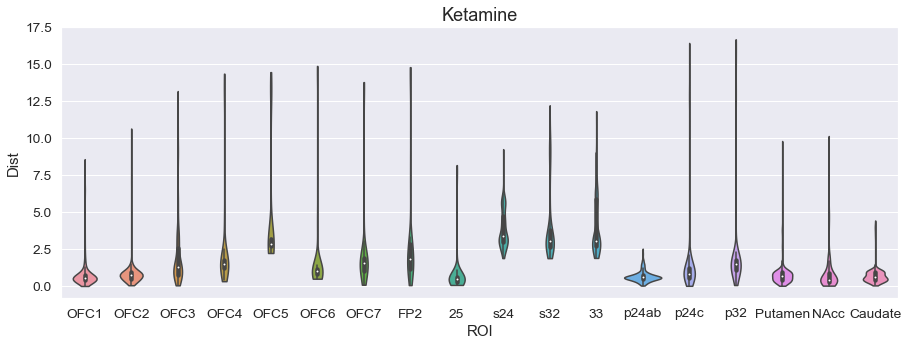

In [236]:
plt.figure(figsize=(15,5))
sns.set(font_scale = 1.25)
ax = sns.violinplot(x="ROI", y="Dist", data=k_df, order = roi_list_plot, split=True, cut=0)
plt.setp(ax,yticks=[0, 2.5, 5, 7.5, 10, 12.5, 15, 17.5])
#plt.ylim=(0, 15)
plt.title('Ketamine', fontsize=18)

**Placebo**

In [140]:
b_p_dist_dict=calculate_distance(dict_b_p, centroid_dict_b_p)

centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  -0.7862423658370972 and  -3.3338654041290283
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  -0.2680830657482147 and  -7.063679218292236
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.8627862334251404 and  -3.7786433696746826
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  1.1241811513900757 and  -4.238884925842285
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  1.2239429950714111 and  -4.288256645202637
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.6021291613578796 and  -4.187128067016602
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.37628841400146484 and  -4.646596908569336
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.6802747249603271 and  -4.497339725494385
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.723612964153289

x+y:  0.8257402181625366 and  -3.2118005752563477
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  1.0315533876419067 and  -3.052359104156494
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.4851830005645752 and  -3.038649797439575
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  1.1097491979599 and  -3.5396993160247803
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  1.1415791511535645 and  -3.3556816577911377
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.7492769360542297 and  -4.420236110687256
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.7326368093490601 and  -4.349595069885254
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.6415130496025085 and  -4.233208656311035
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.927880048751831 and  -4.709279537200928
centroid_x:  0.8174940943717957
centroid_y:  -4

centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.20497438311576843 and  -4.644713401794434
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.7407841682434082 and  -4.164421558380127
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.4694284498691559 and  -5.4005632400512695
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.38238289952278137 and  -4.917966842651367
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.2360731065273285 and  -5.493201732635498
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.393342524766922 and  -5.044569969177246
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.32336047291755676 and  -4.3075337409973145
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.4864819347858429 and  -3.6321492195129395
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.3026350736

centroid_y:  -2.4175422191619873
x+y:  1.0751287937164307 and  -3.2310500144958496
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.1678738594055176 and  -3.238062858581543
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  1.2615572214126587 and  -3.279987335205078
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  1.3730134963989258 and  -3.3043429851531982
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  1.0823239088058472 and  -4.055084228515625
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.7816947102546692 and  -4.538404941558838
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.8067339658737183 and  -4.912942409515381
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.9318074584007263 and  -4.587821006774902
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.8702196478843689 and  -4.843121528625488
centroid_x:

x+y:  0.649431586265564 and  -4.816539287567139
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.2445242553949356 and  -4.868026256561279
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.13524428009986877 and  -4.693714618682861
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.1916651874780655 and  -4.4306960105896
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.19511675834655762 and  -4.543818950653076
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  -0.03113851509988308 and  -4.519659042358398
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  -0.2007818967103958 and  -4.442241191864014
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  -0.5338534116744995 and  -3.5143356323242188
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  -0.742036759853363 and  -3.4243004322052
centroid_x:  0.4219600260257721
centr

x+y:  0.5811270475387573 and  -4.840334415435791
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.44241705536842346 and  -4.492918491363525
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.4930438697338104 and  -3.886972665786743
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.480666846036911 and  -3.1666760444641113
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.38935548067092896 and  -2.668959140777588
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.4552048444747925 and  -2.5206925868988037
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.43919044733047485 and  -2.6238420009613037
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.35178256034851074 and  -2.5818052291870117
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.1393696367740631 and  -2.6258366107940674
centroid_x:  0.4219600260257721
ce

centroid_y:  -2.4175422191619873
x+y:  -0.5969398617744446 and  -3.284001111984253
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  -0.592840850353241 and  -3.100987672805786
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  -0.8189218044281006 and  -2.904134750366211
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  -0.8411980271339417 and  -2.880868434906006
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  -0.8349079489707947 and  -3.04701828956604
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  -0.9864616990089417 and  -2.939136028289795
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  -1.0386321544647217 and  -2.9561169147491455
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  -1.0381273031234741 and  -2.6729109287261963
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  -0.8941503763198853 and  -2.8883335590362

centroid_y:  -2.4175422191619873
x+y:  0.2992698848247528 and  -2.3672523498535156
centroid_x:  2.754019260406494
centroid_y:  0.8248260021209717
x+y:  1.3179826736450195 and  -2.0259993076324463
centroid_x:  2.754019260406494
centroid_y:  0.8248260021209717
x+y:  0.790770411491394 and  -2.394763708114624
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.0409977436065674 and  -2.3506014347076416
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.3812673091888428 and  -2.095796585083008
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.4284511804580688 and  -2.094823122024536
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.2919211387634277 and  -2.3956844806671143
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.9610487818717957 and  -2.951751470565796
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.8735640645027161 and  -3.6669986248016357
centro

centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  -0.5469875335693359 and  -5.784420490264893
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  -0.2354104071855545 and  -4.621081829071045
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  -0.015881063416600227 and  -4.777310848236084
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.021769782528281212 and  -4.248119354248047
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  -0.01562901772558689 and  -3.604175090789795
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  -0.23579438030719757 and  -3.4655585289001465
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  -0.4199475347995758 and  -3.1051061153411865
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  -0.3534795939922333 and  -3.0938005447387695
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  -

x+y:  1.0156364440917969 and  -2.1293320655822754
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.7128998637199402 and  -3.6397149562835693
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  0.5340283513069153 and  -4.20865535736084
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.2831205725669861 and  -5.170864105224609
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.17632606625556946 and  -5.672850131988525
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.26642870903015137 and  -5.544261932373047
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.37615859508514404 and  -5.441872596740723
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.2628176212310791 and  -5.615363597869873
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.5060334801673889 and  -5.030790328979492
centroid_x:  0.4219600260257721
centroid_

centroid_y:  -2.4175422191619873
x+y:  1.928149938583374 and  -1.5374795198440552
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.750902771949768 and  -1.8556578159332275
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.8188127279281616 and  -2.0296709537506104
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  1.7114202976226807 and  -2.22259783744812
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  1.5269267559051514 and  -2.6437411308288574
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  1.5182223320007324 and  -2.892613649368286
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  1.3283851146697998 and  -3.548245668411255
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  -0.046464934945106506 and  -6.110655784606934
centroid_x:  0.8174940943717957
centroid_y:  -4.294835090637207
x+y:  0.3391003906726837 and  -5.760259628295898
centroid

centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.3026859760284424 and  -1.0367295742034912
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.3288484513759613 and  -1.051002025604248
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.024746034294366837 and  -1.194321632385254
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  -0.09982303529977798 and  -1.5261945724487305
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  -0.066680908203125 and  -2.322666645050049
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.34425005316734314 and  -3.0862605571746826
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.569999635219574 and  -3.098048210144043
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.3678838014602661 and  -2.965959310531616
centroid_x:  0.03213066980242729
centroid_y:  -4.095734119415283
x+y:  0.42028248

centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  2.160626173019409 and  0.11331906914710999
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  2.0256733894348145 and  -0.40475717186927795
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  2.210888147354126 and  -0.5992224812507629
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  2.0270028114318848 and  -0.6663808822631836
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  2.0073747634887695 and  -0.9722475409507751
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  2.1444339752197266 and  -1.0144962072372437
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  2.054809093475342 and  -1.269212245941162
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.6577736139297485 and  -1.5495260953903198
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.0460653305

x+y:  2.4750287532806396 and  -1.17692232131958
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  2.3857080936431885 and  -1.360817313194275
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -0.9764199256896973 and  -9.348817825317383
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.3566330671310425 and  -9.436790466308594
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  -0.6921353936195374 and  -9.212779998779297
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.23958386480808258 and  -5.983749866485596
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.9508060812950134 and  -4.538329601287842
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.504900574684143 and  -3.3302958011627197
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  1.7071458101272583 and  -2.9304726123809814
centroid_x:  2.2955029010772705
cen

x+y:  -0.9811018705368042 and  -7.838682651519775
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  -0.8147576451301575 and  -7.360677719116211
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  -0.9517788290977478 and  -7.803202152252197
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  -1.148603081703186 and  -7.892042636871338
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  -1.3381086587905884 and  -7.906976699829102
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  -0.8083411455154419 and  0.9705035090446472
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  -0.13282282650470734 and  -0.08821681141853333
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  0.14731615781784058 and  -0.6001493334770203
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  0.20510244369506836 and  -0.5929113030433655
centroid_x:  -1.1707528829

centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.0886659622192383 and  -1.834316372871399
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.1200664043426514 and  -1.5001906156539917
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.1947369575500488 and  -1.3627903461456299
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.0434818267822266 and  -1.2623484134674072
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.1078572273254395 and  -0.9703382849693298
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.625331997871399 and  -0.47525864839553833
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  1.925286054611206 and  0.02252715639770031
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.041816234588623 and  0.6720550656318665
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.16804742813

centroid_y:  -0.9010968208312988
x+y:  2.5169034004211426 and  -0.07358619570732117
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.835721254348755 and  0.6424080729484558
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  3.278937578201294 and  -0.4463076591491699
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.9824864864349365 and  -0.7947090268135071
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.9341607093811035 and  -0.8315389156341553
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  3.1621336936950684 and  -0.5103873610496521
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  3.27205228805542 and  -0.48120611906051636
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  0.7379852533340454 and  -2.2030868530273438
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -0.7363271713256836 and  -9.924548149108887


x+y:  -1.6552035808563232 and  -7.667017459869385
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  -1.7704545259475708 and  -7.970004081726074
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  -1.6371910572052002 and  -7.91566276550293
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  -1.5559451580047607 and  -8.241504669189453
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  -1.2607920169830322 and  -8.419234275817871
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  -1.1894357204437256 and  -8.287109375
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  -1.3054749965667725 and  -8.073983192443848
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  -1.6836872100830078 and  -8.021787643432617
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  -1.8793689012527466 and  -7.911896228790283
centroid_x:  -1.1707528829574585
cent

centroid_y:  0.8248260021209717
x+y:  3.5767879486083984 and  0.7936813235282898
centroid_x:  2.754019260406494
centroid_y:  0.8248260021209717
x+y:  3.599264144897461 and  0.6537966728210449
centroid_x:  2.754019260406494
centroid_y:  0.8248260021209717
x+y:  3.324246883392334 and  0.7341275215148926
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  3.2056798934936523 and  0.63503497838974
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  3.021622896194458 and  0.36834901571273804
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.5776584148406982 and  0.04415053501725197
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.5680387020111084 and  0.13956958055496216
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.4965615272521973 and  -0.08420882374048233
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  2.519739866256714 and  -0.3655050992965698
centroid_x:  

centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.3192775249481201 and  -9.890520095825195
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  1.977741003036499 and  -1.2595434188842773
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.105274200439453 and  -1.116609811782837
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.091535806655884 and  -1.072752594947815
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.1931276321411133 and  -0.7595059871673584
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.283372402191162 and  -0.04889240115880966
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.322604179382324 and  0.1842927485704422
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  2.604936122894287 and  0.38222771883010864
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  2.7141830921173096 

centroid_y:  -6.537322521209717
x+y:  0.3733268082141876 and  -0.015374007634818554
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.5589905381202698 and  0.10457277297973633
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  0.9952704906463623 and  0.1777300238609314
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  1.5301604270935059 and  0.8788519501686096
centroid_x:  0.4219600260257721
centroid_y:  -2.4175422191619873
x+y:  2.0750484466552734 and  1.7102230787277222
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  2.351149797439575 and  1.8633743524551392
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  2.533513307571411 and  1.9246270656585693
centroid_x:  2.754019260406494
centroid_y:  0.8248260021209717
x+y:  2.450934886932373 and  2.0554885864257812
centroid_x:  2.754019260406494
centroid_y:  0.8248260021209717
x+y:  2.5076687335968018 and  1.9427777528762817
centroid_x: 

x+y:  3.6107161045074463 and  0.49669888615608215
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  3.5569727420806885 and  0.5074435472488403
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  3.561229705810547 and  0.3804590702056885
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  3.3724849224090576 and  0.271545946598053
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.7565982341766357 and  -0.027338257059454918
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.692584276199341 and  -0.05059872567653656
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.772706985473633 and  -0.19741833209991455
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.8599209785461426 and  -0.47453004121780396
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.6826517581939697 and  -0.5191243290901184
centroid_x:  -1.8811160326004028


centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.0628396272659302 and  -10.343247413635254
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.134804606437683 and  -10.2586088180542
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.4008095264434814 and  -0.20578140020370483
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.485248565673828 and  -0.011609808541834354
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.4428608417510986 and  0.49696868658065796
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.4097373485565186 and  0.7252658605575562
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.672882318496704 and  0.5631541609764099
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  2.776991605758667 and  0.8319457769393921
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  3.2095303535461

x+y:  2.599273204803467 and  1.5720243453979492
centroid_x:  2.754019260406494
centroid_y:  0.8248260021209717
x+y:  3.299801826477051 and  1.7983405590057373
centroid_x:  2.754019260406494
centroid_y:  0.8248260021209717
x+y:  3.7499139308929443 and  1.4748131036758423
centroid_x:  2.754019260406494
centroid_y:  0.8248260021209717
x+y:  3.8059768676757812 and  1.3033030033111572
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  3.9567489624023438 and  1.1160924434661865
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  3.8927524089813232 and  0.9924072623252869
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  3.907405138015747 and  0.9296166896820068
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  3.9307096004486084 and  0.9908673763275146
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  4.041627883911133 and  0.9688735008239746
centroid_x:  1.9998873472213745
centroid_y:  0.1827237

x+y:  3.7381114959716797 and  0.5176144242286682
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  3.6862754821777344 and  0.19948594272136688
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  3.621501922607422 and  0.27487534284591675
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  3.289804697036743 and  -0.00920721422880888
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  3.4231269359588623 and  0.1638195663690567
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  3.4099905490875244 and  0.08461043238639832
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  3.3682193756103516 and  -0.19113045930862427
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  3.312047004699707 and  -0.35031330585479736
centroid_x:  2.2955029010772705
centroid_y:  -0.9010968208312988
x+y:  2.8115439414978027 and  -0.17294299602508545
centroid_x:  -0.7929443120956421
cent

x+y:  -1.3433139324188232 and  -11.847522735595703
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  3.4648711681365967 and  1.794690728187561
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  3.594646692276001 and  1.5891674757003784
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  2.821779251098633 and  -0.12475287914276123
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  2.595357656478882 and  0.016531992703676224
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  -2.551670789718628 and  -8.743420600891113
centroid_x:  1.9998873472213745
centroid_y:  0.1827237904071808
x+y:  -2.5124669075012207 and  -8.677793502807617
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  -2.7488527297973633 and  -8.564072608947754
centroid_x:  -1.1707528829574585
centroid_y:  -6.537322521209717
x+y:  -2.918191432952881 and  -8.35444450378418
centroid_x:  -3.100541591644287
centroid_y

centroid_y:  -1.220505952835083
x+y:  3.042219400405884 and  0.3585163950920105
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  3.731372833251953 and  0.5057981610298157
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  3.643275499343872 and  0.3102583587169647
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  3.615790843963623 and  0.07827814668416977
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  3.3863816261291504 and  -0.020496008917689323
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  3.456040859222412 and  0.0434555783867836
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  3.299354314804077 and  -0.013866336084902287
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  3.4317758083343506 and  -0.10205041617155075
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  3.2837581634521484 and  -0.1387517899274826
centroid_x

x+y:  3.673166513442993 and  1.6103124618530273
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  3.845642566680908 and  1.2923827171325684
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  3.881181478500366 and  1.2288460731506348
centroid_x:  -3.100541591644287
centroid_y:  -9.115837097167969
x+y:  -2.174126625061035 and  -9.087418556213379
centroid_x:  -3.100541591644287
centroid_y:  -9.115837097167969
x+y:  -2.4970035552978516 and  -9.085478782653809
centroid_x:  -3.100541591644287
centroid_y:  -9.115837097167969
x+y:  -2.532222270965576 and  -9.09263801574707
centroid_x:  -3.100541591644287
centroid_y:  -9.115837097167969
x+y:  -2.4472556114196777 and  -8.683615684509277
centroid_x:  -2.749474048614502
centroid_y:  -10.236037254333496
x+y:  -2.517113208770752 and  -8.65868091583252
centroid_x:  -2.749474048614502
centroid_y:  -10.236037254333496
x+y:  -2.6445319652557373 and  -9.227509498596191
centroid_x:  -1.8811160326004028
centroid_y

centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -0.8305364847183228 and  -10.010576248168945
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -0.7816843390464783 and  -9.84810733795166
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.2032111883163452 and  -10.200643539428711
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.0638642311096191 and  -9.62433910369873
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.0355881452560425 and  -9.906111717224121
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.087592363357544 and  -10.20848560333252
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -0.7984337210655212 and  -9.255814552307129
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -2.8260951042175293 and  1.8923470973968506
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -0.612909674

x+y:  -0.8123000860214233 and  -9.725931167602539
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -0.9690254926681519 and  -9.594218254089355
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.3481301069259644 and  -9.5968656539917
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.639847755432129 and  -9.594758987426758
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  -0.5626529455184937 and  -6.858308792114258
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -0.8421990871429443 and  -9.92635726928711
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.0664628744125366 and  -10.257955551147461
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.3933393955230713 and  -9.965124130249023
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -0.8737748265266418 and  -10.099833488464355
centroid_x:  -0.7929443120956421


x+y:  -1.3895663022994995 and  -9.778013229370117
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.4795863628387451 and  -9.815013885498047
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.5320463180541992 and  -9.660883903503418
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.4908339977264404 and  -9.326160430908203
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.34718656539917 and  -9.527849197387695
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  -1.3121870756149292 and  -9.39358139038086
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  -1.251827359199524 and  -9.51288890838623
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  -1.298432469367981 and  -9.40284538269043
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  -1.1011075973510742 and  -8.974498748779297
centroid_x:  -0.7929443120956421
centroid

centroid_y:  -10.209701538085938
x+y:  -1.816689372062683 and  -9.981897354125977
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.6675763130187988 and  -10.114579200744629
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.669539451599121 and  -9.88625717163086
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.7684365510940552 and  -9.940656661987305
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.5543218851089478 and  -10.04926872253418
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.7438970804214478 and  -9.955617904663086
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.7465245723724365 and  -10.0480318069458
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.8305374383926392 and  -9.834233283996582
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.8948150873184204 and  -9.781361579895

x+y:  3.9270918369293213 and  0.22742390632629395
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.1566107273101807 and  -10.692793846130371
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.1008708477020264 and  -10.53208065032959
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.144466757774353 and  -10.704859733581543
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.1011279821395874 and  -10.638901710510254
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -0.9436830282211304 and  -10.263474464416504
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.3733458518981934 and  -10.095451354980469
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.2669920921325684 and  -10.42325496673584
centroid_x:  2.4024291038513184
centroid_y:  -1.220505952835083
x+y:  -1.3367953300476074 and  -10.533346176147461
centroid_x:  2.40242910385

centroid_y:  -9.170856475830078
x+y:  -1.2165038585662842 and  -10.821089744567871
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.332169771194458 and  -11.097386360168457
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.1908516883850098 and  -10.74576473236084
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.2990480661392212 and  -10.650734901428223
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -0.8977929353713989 and  -10.257440567016602
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.1480374336242676 and  -10.804519653320312
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.3159209489822388 and  -10.835708618164062
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.4153128862380981 and  -11.015899658203125
centroid_x:  -0.7929443120956421
centroid_y:  -9.170856475830078
x+y:  -1.2446696758270264 and  -10.7047357

centroid_x:  -3.100541591644287
centroid_y:  -9.115837097167969
x+y:  -3.0557620525360107 and  -9.604002952575684
centroid_x:  -3.100541591644287
centroid_y:  -9.115837097167969
x+y:  -2.8413522243499756 and  -9.884417533874512
centroid_x:  -3.100541591644287
centroid_y:  -9.115837097167969
x+y:  -2.671250820159912 and  -10.400303840637207
centroid_x:  -3.100541591644287
centroid_y:  -9.115837097167969
x+y:  -2.760850429534912 and  -10.347678184509277
centroid_x:  -3.100541591644287
centroid_y:  -9.115837097167969
x+y:  -2.7482547760009766 and  -10.431331634521484
centroid_x:  -2.749474048614502
centroid_y:  -10.236037254333496
x+y:  -2.507180690765381 and  -10.75033187866211
centroid_x:  -2.749474048614502
centroid_y:  -10.236037254333496
x+y:  -2.280106544494629 and  -10.918503761291504
centroid_x:  -2.749474048614502
centroid_y:  -10.236037254333496
x+y:  -2.413238048553467 and  -10.93634033203125
centroid_x:  -2.749474048614502
centroid_y:  -10.236037254333496
x+y:  -2.481956958770

centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.7952520847320557 and  -11.364675521850586
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.6812152862548828 and  -11.045380592346191
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.146043062210083 and  -10.963778495788574
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.125168800354004 and  -11.02059268951416
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.2021238803863525 and  -10.962993621826172
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.1791067123413086 and  -11.109331130981445
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.1558215618133545 and  -11.101378440856934
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -0.8400754928588867 and  0.654211163520813
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y

centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.016026735305786 and  -11.45604133605957
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.2150635719299316 and  -11.609644889831543
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.2134933471679688 and  -11.437796592712402
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.167527675628662 and  -11.311649322509766
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.1437089443206787 and  -11.427396774291992
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.040649175643921 and  -11.367640495300293
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.7907741069793701 and  -11.2715425491333
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.9913649559020996 and  -11.062385559082031
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:

x+y:  -1.5771822929382324 and  -11.665837287902832
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.5159358978271484 and  -11.845460891723633
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.4886358976364136 and  -11.56615161895752
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.4315404891967773 and  -11.530683517456055
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.5946033000946045 and  -11.499543190002441
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.468467354774475 and  -11.66486644744873
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.6104543209075928 and  -11.561190605163574
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.5884194374084473 and  -11.75615119934082
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -1.8913543224334717 and  -11.35149097442627
centroid_x:  -1.88

x+y:  -2.9530086517333984 and  -10.945361137390137
centroid_x:  -2.749474048614502
centroid_y:  -10.236037254333496
x+y:  -2.940005302429199 and  -11.138299942016602
centroid_x:  -2.749474048614502
centroid_y:  -10.236037254333496
x+y:  -3.04117751121521 and  -11.271401405334473
centroid_x:  -2.749474048614502
centroid_y:  -10.236037254333496
x+y:  -2.8435795307159424 and  -11.407146453857422
centroid_x:  -2.749474048614502
centroid_y:  -10.236037254333496
x+y:  -2.8348541259765625 and  -11.192845344543457
centroid_x:  -2.749474048614502
centroid_y:  -10.236037254333496
x+y:  -2.5545363426208496 and  -11.727606773376465
centroid_x:  -2.749474048614502
centroid_y:  -10.236037254333496
x+y:  -2.6861541271209717 and  -11.613341331481934
centroid_x:  -2.749474048614502
centroid_y:  -10.236037254333496
x+y:  -2.780027151107788 and  -11.370762825012207
centroid_x:  -2.749474048614502
centroid_y:  -10.236037254333496
x+y:  -2.846778392791748 and  -11.04681396484375
centroid_x:  -3.10054159164

centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.866442918777466 and  -7.912271976470947
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.8790390491485596 and  -8.099105834960938
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.7625732421875 and  -8.051929473876953
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.8087081909179688 and  -8.16469669342041
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.7644729614257812 and  -8.103875160217285
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.784595489501953 and  -8.103353500366211
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.837589979171753 and  -8.153146743774414
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.7734999656677246 and  -8.24974536895752
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.809475898742676 and  -8

centroid_y:  -10.209701538085938
x+y:  -2.306506633758545 and  -12.186979293823242
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.2970352172851562 and  -12.129678726196289
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.213809013366699 and  -6.5315351486206055
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.249021530151367 and  -6.622509956359863
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.2859160900115967 and  -6.761500358581543
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.323786497116089 and  -6.718479633331299
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.3412868976593018 and  -6.910041809082031
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.4491684436798096 and  -6.944035053253174
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.5966427326202393 and  -7.393343448638916
cent

x+y:  -3.757582426071167 and  -7.809863567352295
centroid_x:  -2.4798402786254883
centroid_y:  -5.84981632232666
x+y:  -3.7087345123291016 and  -7.796544075012207
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.411463975906372 and  -12.406972885131836
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.437283754348755 and  -12.401124954223633
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.454832077026367 and  -12.235614776611328
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.374255895614624 and  -12.47688102722168
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.4509637355804443 and  -12.382698059082031
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.297417640686035 and  -12.379703521728516
centroid_x:  -1.8811160326004028
centroid_y:  -10.209701538085938
x+y:  -2.369732141494751 and  -12.271602630615234
centroid_x:  -1.881116032

centroid_x:  -3.382439374923706
centroid_y:  1.5165292024612427
x+y:  -3.923448324203491 and  1.5698938369750977
centroid_x:  -3.382439374923706
centroid_y:  1.5165292024612427
x+y:  -3.706897020339966 and  1.5168348550796509
centroid_x:  -3.382439374923706
centroid_y:  1.5165292024612427
x+y:  -3.5922436714172363 and  1.234270691871643
centroid_x:  -3.382439374923706
centroid_y:  1.5165292024612427
x+y:  -3.6675431728363037 and  1.5681374073028564
centroid_x:  -3.382439374923706
centroid_y:  1.5165292024612427
x+y:  -3.888735294342041 and  1.5631603002548218
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -3.8912363052368164 and  1.643181324005127
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -4.121942520141602 and  1.8109546899795532
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -4.641116142272949 and  1.7041847705841064
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -4.704938888549805 and  1

centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.498559474945068 and  0.4223676323890686
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.197312355041504 and  0.5593513250350952
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.467762470245361 and  0.6803755760192871
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.998758792877197 and  0.4250584542751312
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.193564414978027 and  0.34991323947906494
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.775776386260986 and  0.44530707597732544
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.448923587799072 and  0.5562929511070251
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.1174116134643555 and  0.8383129835128784
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.3948822021484375 and

x+y:  -7.3140482902526855 and  0.18401192128658295
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.090203762054443 and  0.19782878458499908
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.700479984283447 and  0.28056246042251587
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.828620910644531 and  0.46175891160964966
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.988402366638184 and  0.262861043214798
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.207207202911377 and  0.20469221472740173
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.475262641906738 and  0.25145581364631653
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.145026206970215 and  0.0364946611225605
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.640645503997803 and  0.3197799324989319
centroid_x:  -6.192319393157959
centroid_

x+y:  -6.831813812255859 and  0.35958120226860046
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.850846767425537 and  0.42767760157585144
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.400950908660889 and  0.26914018392562866
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.4734039306640625 and  0.17005163431167603
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.005736351013184 and  0.2801564633846283
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.98353910446167 and  0.42585036158561707
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.387119770050049 and  0.3805026710033417
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.306209087371826 and  0.25309592485427856
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.503204822540283 and  0.10365750640630722
centroid_x:  -6.192319393157959
centroid

centroid_y:  1.8831804990768433
x+y:  -1.2146461009979248 and  0.6522601246833801
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.1595853567123413 and  0.5498566627502441
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.8490707874298096 and  1.0012352466583252
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -2.4668211936950684 and  1.3717437982559204
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.683985948562622 and  1.3276900053024292
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.2333154678344727 and  0.8595184087753296
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.067169189453125 and  0.32314854860305786
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.0648629665374756 and  0.664351224899292
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.1149260997772217 and  0.8079128861427307


x+y:  -2.01181697845459 and  1.1074464321136475
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -2.1850993633270264 and  1.3678582906723022
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -2.607490062713623 and  1.4935498237609863
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -2.766089677810669 and  1.722339391708374
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -2.9171929359436035 and  1.8612650632858276
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -3.018490791320801 and  1.7488378286361694
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -4.684831142425537 and  1.1594417095184326
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -4.593402862548828 and  1.1074848175048828
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -3.1857123374938965 and  1.8502508401870728
centroid_x:  -2.1978766918182373
centroi

centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -2.7743122577667236 and  2.066709041595459
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -2.7690865993499756 and  2.3835530281066895
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -3.064690351486206 and  2.5408949851989746
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -3.2100539207458496 and  2.425877094268799
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -3.2968828678131104 and  2.2609376907348633
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -5.806009769439697 and  1.7544671297073364
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -5.723094463348389 and  1.5594418048858643
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -5.8698248863220215 and  1.060663104057312
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.004723072052002 a

centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.026608943939209 and  1.8317679166793823
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.195952415466309 and  1.6154879331588745
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.382903575897217 and  1.5913827419281006
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.362312316894531 and  1.450571894645691
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.884253978729248 and  0.5109933614730835
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.0724873542785645 and  0.08136949688196182
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.664791107177734 and  1.120097041130066
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.292979717254639 and  1.6206657886505127
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.313253879547119 and  1.

centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.947888374328613 and  1.0973472595214844
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.071429252624512 and  0.9442377686500549
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.196554183959961 and  0.2927396595478058
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.2685675621032715 and  0.8911147117614746
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.885386943817139 and  1.2627501487731934
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.610497951507568 and  1.528517723083496
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.3472771644592285 and  1.564642310142517
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.340664863586426 and  1.800940752029419
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.0401763916015625 and  1.

centroid_y:  1.1559773683547974
x+y:  -7.17649507522583 and  0.9262533783912659
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.167669773101807 and  0.7134381532669067
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.773573875427246 and  1.3221222162246704
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.507481098175049 and  1.5427104234695435
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.541068077087402 and  1.7547063827514648
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.403214931488037 and  1.800520420074463
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -2.599290370941162 and  2.7029476165771484
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -2.552616834640503 and  2.597536087036133
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -2.6623854637145996 and  2.6952764987945557
centroid_x:  -

x+y:  -2.554391384124756 and  2.82812237739563
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.4683918952941895 and  1.486899733543396
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.624710559844971 and  1.492519497871399
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.575664043426514 and  1.4653819799423218
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.101664066314697 and  1.1075879335403442
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -7.091926097869873 and  1.205073595046997
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.699106693267822 and  1.6031674146652222
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.443528652191162 and  1.8213245868682861
centroid_x:  -6.192319393157959
centroid_y:  1.1559773683547974
x+y:  -6.494688510894775 and  1.6862268447875977
centroid_x:  -2.1978766918182373
centroid_y:  1.883

centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.812299132347107 and  1.675430417060852
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.858128547668457 and  1.8913211822509766
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -2.0265238285064697 and  1.9054044485092163
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -2.4314088821411133 and  2.085552215576172
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.3841147422790527 and  1.565967082977295
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.1354154348373413 and  1.4483897686004639
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.3120672702789307 and  1.4648000001907349
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.7802921533584595 and  1.7150644063949585
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.94378244876

centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.137515664100647 and  1.398262619972229
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.0499207973480225 and  1.3536608219146729
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.1925756931304932 and  1.5364402532577515
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.6959582567214966 and  2.004237174987793
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.5066090822219849 and  1.7973213195800781
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.662578821182251 and  1.926198124885559
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.6545531749725342 and  1.8893014192581177
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.074135661125183 and  1.3941789865493774
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -1.119069814682

centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -0.7566061615943909 and  1.078513503074646
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -0.6858259439468384 and  1.075553059577942
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -0.8309791684150696 and  1.121330738067627
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -0.7638753056526184 and  1.061997890472412
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -0.7824072241783142 and  1.2203316688537598
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -0.7460009455680847 and  1.0005877017974854
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -0.6934404373168945 and  1.1472225189208984
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -0.7920074462890625 and  1.120652675628662
centroid_x:  -2.1978766918182373
centroid_y:  1.8831804990768433
x+y:  -0.81124538183

In [141]:
p_dist_dict=calculate_distance(dict_p, centroid_dict_p)

centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.2325849533081055 and  -3.420443534851074
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.249701499938965 and  -3.0964725017547607
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.4633443355560303 and  -3.4756205081939697
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.3362796306610107 and  -3.162090539932251
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.292630910873413 and  -4.14321756362915
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.441861629486084 and  -3.442966938018799
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.3190386295318604 and  -3.5150105953216553
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.411046028137207 and  -3.685275077819824
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.1448

x+y:  -2.3147737979888916 and  -3.739400625228882
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.464264154434204 and  -3.727407693862915
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.6711466312408447 and  -3.8562796115875244
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.5539753437042236 and  -3.865206718444824
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.69783091545105 and  -3.662790060043335
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.3102540969848633 and  -3.7000083923339844
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.2049906253814697 and  -3.5437099933624268
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.261282444000244 and  -3.097316265106201
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.6299166679382324 and  -3.381405830383301
centroid_x:  -1.95291018486022

centroid_y:  -3.3711555004119873
x+y:  -2.203664541244507 and  -3.8541879653930664
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.1717278957366943 and  -3.9829258918762207
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -1.991533637046814 and  -3.9511990547180176
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.543715000152588 and  -3.7269179821014404
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.1028947830200195 and  -3.6986031532287598
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.17429256439209 and  -3.7372243404388428
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.4898526668548584 and  -3.7144668102264404
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.3689823150634766 and  -3.704597234725952
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -1.3947880268096924 and  -3.126

x+y:  -3.085488796234131 and  -2.074326992034912
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -2.5867671966552734 and  -3.0111284255981445
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -2.7351396083831787 and  -3.5887372493743896
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -2.934407949447632 and  -2.7486257553100586
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.823216676712036 and  -3.2927324771881104
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.8419320583343506 and  -3.2101454734802246
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.694735527038574 and  -3.9102892875671387
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.8880183696746826 and  -4.185177803039551
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.809281349182129 and  -4.004568099975586
centroid_x:  -2.3470056056

centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.4730589389801025 and  -3.692450761795044
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.470609664916992 and  -3.913663864135742
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.085623025894165 and  -3.747425079345703
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.027851104736328 and  -3.2054941654205322
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -1.8964520692825317 and  -3.1379384994506836
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -1.3557013273239136 and  -2.9885413646698
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.12148118019104 and  -3.0017380714416504
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.12065589427948 and  -2.87918758392334
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.078400

centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -2.5671322345733643 and  -2.7055771350860596
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -2.611332893371582 and  -2.7020950317382812
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -3.003495454788208 and  -2.8461246490478516
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -3.0254757404327393 and  -3.36208176612854
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.8995718955993652 and  -3.800025463104248
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.8743996620178223 and  -3.96498441696167
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.945967435836792 and  -3.919796943664551
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.519392967224121 and  -4.387520790100098
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.41163

centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.5586694478988647 and  -1.976162314414978
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.6236257553100586 and  -2.0082268714904785
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.5015604496002197 and  -2.1160061359405518
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.457281470298767 and  -2.272193431854248
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.6167187690734863 and  -2.2100765705108643
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -2.1868574619293213 and  -2.929452657699585
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.2909739017486572 and  -3.864415407180786
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -2.1026318073272705 and  -4.2556281089782715
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y

x+y:  -2.6266074180603027 and  -4.478039741516113
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -2.539097309112549 and  -4.392079830169678
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -3.139413356781006 and  -2.798088312149048
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -3.1464266777038574 and  -2.8329617977142334
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -1.2213610410690308 and  -9.258923530578613
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -3.3144853115081787 and  -3.4857587814331055
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.3443509340286255 and  -10.102980613708496
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.3601469993591309 and  -10.170145988464355
centroid_x:  -1.5608854293823242
centroid_y:  -3.319139003753662
x+y:  -1.2548398971557617 and  -3.0354299545288086
centroid_x:  -1.560885429

centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.4802725315093994 and  -1.872666835784912
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.528778314590454 and  -1.5128684043884277
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.585500717163086 and  -1.5801961421966553
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.5355721712112427 and  -1.5254706144332886
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.5021517276763916 and  -1.3087126016616821
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.3447692394256592 and  -1.4088211059570312
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.230445384979248 and  -1.7551019191741943
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.7102277278900146 and  -1.1687965393066406
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+

x+y:  -2.6230037212371826 and  -2.292478322982788
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.2510666847229004 and  -2.9909212589263916
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.068720817565918 and  -4.250483989715576
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -1.7863011360168457 and  -5.05416202545166
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -1.79532790184021 and  -4.992596626281738
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.3248488903045654 and  -4.509908199310303
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.5325889587402344 and  -2.906255006790161
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -2.6634459495544434 and  -2.228591203689575
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -2.5607316493988037 and  -2.1630828380584717
centroid_x:  -1.952910184860229

x+y:  -1.5441086292266846 and  -3.7147088050842285
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -1.7359671592712402 and  -5.513495445251465
centroid_x:  -1.0659900903701782
centroid_y:  -5.916574954986572
x+y:  -1.6349695920944214 and  -5.664549827575684
centroid_x:  -1.0659900903701782
centroid_y:  -5.916574954986572
x+y:  -1.9241528511047363 and  -4.877333641052246
centroid_x:  -1.0659900903701782
centroid_y:  -5.916574954986572
x+y:  -2.1986773014068604 and  -4.531769275665283
centroid_x:  -1.0659900903701782
centroid_y:  -5.916574954986572
x+y:  -1.5325182676315308 and  -5.187546730041504
centroid_x:  -1.0659900903701782
centroid_y:  -5.916574954986572
x+y:  -1.3440121412277222 and  -5.260785102844238
centroid_x:  -1.0659900903701782
centroid_y:  -5.916574954986572
x+y:  -1.313826560974121 and  -5.691739082336426
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -1.3233243227005005 and  -5.684680461883545
centroid_x:  -1.812573432922

centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -2.325470209121704 and  -0.7812283635139465
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -2.6173081398010254 and  -0.374769926071167
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -2.153487205505371 and  -0.40055209398269653
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -2.1934986114501953 and  -0.3777676522731781
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -1.1077955961227417 and  -4.394824981689453
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -1.288865089416504 and  -6.058551788330078
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -1.3049513101577759 and  -6.680652618408203
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -1.1093641519546509 and  -6.941039085388184
centroid_x:  -2.347005605697632
centroid_y:  -3.6161880493164062
x+y:  -1.12971

x+y:  -3.0615642070770264 and  -0.22497978806495667
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -3.07381010055542 and  -0.5091889500617981
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -3.129114866256714 and  -0.5272358655929565
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -3.0996451377868652 and  -0.5646458864212036
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -3.099757432937622 and  -0.5602410435676575
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -2.8810582160949707 and  -0.44472551345825195
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -2.864409923553467 and  -0.5966041088104248
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -3.0343406200408936 and  -1.7762731313705444
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -2.9350953102111816 and  -1.839800477027893
centroid_x:  -1.9

x+y:  -1.4825814962387085 and  -2.525118350982666
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -1.7428230047225952 and  -2.683636426925659
centroid_x:  -1.8125734329223633
centroid_y:  -3.3711555004119873
x+y:  -1.6058390140533447 and  -3.9484663009643555
centroid_x:  -1.0659900903701782
centroid_y:  -5.916574954986572
x+y:  -1.1372096538543701 and  -3.7424705028533936
centroid_x:  -1.0659900903701782
centroid_y:  -5.916574954986572
x+y:  -1.0172343254089355 and  -3.9256374835968018
centroid_x:  -1.0659900903701782
centroid_y:  -5.916574954986572
x+y:  -1.154512882232666 and  -3.524200916290283
centroid_x:  -1.0659900903701782
centroid_y:  -5.916574954986572
x+y:  -1.6296541690826416 and  -5.485854148864746
centroid_x:  -1.0659900903701782
centroid_y:  -5.916574954986572
x+y:  -1.4055495262145996 and  -5.756306171417236
centroid_x:  -1.0659900903701782
centroid_y:  -5.916574954986572
x+y:  -1.2969353199005127 and  -5.520586967468262
centroid_x:  -1.0659900903

x+y:  -2.4160780906677246 and  -0.3294844329357147
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -1.0014439821243286 and  -7.055099010467529
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -1.034555435180664 and  -7.158041954040527
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -0.9533390998840332 and  -7.236843109130859
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -0.9741693735122681 and  -7.3553466796875
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -1.055092692375183 and  -7.557369709014893
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -1.1525099277496338 and  -7.308403968811035
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -1.0196149349212646 and  -7.68510103225708
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -1.0547046661376953 and  -7.322482585906982
centroid_x:  -1.9529101848602295
c

centroid_x:  -3.3903894424438477
centroid_y:  -0.49228209257125854
x+y:  -3.3673593997955322 and  0.2581228017807007
centroid_x:  -3.3903894424438477
centroid_y:  -0.49228209257125854
x+y:  -3.2648417949676514 and  -0.2799886167049408
centroid_x:  -3.3903894424438477
centroid_y:  -0.49228209257125854
x+y:  -3.2823593616485596 and  -0.34399697184562683
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -3.2313790321350098 and  -0.4175060987472534
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -0.9150037169456482 and  -8.903738975524902
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.285245418548584 and  -8.452077865600586
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.466796636581421 and  -8.710631370544434
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.4230246543884277 and  -8.637042999267578
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -3.

x+y:  -0.8536843061447144 and  -7.396141529083252
centroid_x:  -1.0659900903701782
centroid_y:  -5.916574954986572
x+y:  -1.465469479560852 and  -5.341926574707031
centroid_x:  -1.0659900903701782
centroid_y:  -5.916574954986572
x+y:  -1.3296791315078735 and  -0.8970683813095093
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.619707465171814 and  -0.7677189707756042
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.6078853607177734 and  -0.8502345681190491
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.6021140813827515 and  -0.8077712655067444
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.5999135971069336 and  -0.9026041626930237
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.5062713623046875 and  -0.9261497855186462
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -1.6282360553741455 and  -0.8242198824882507
centroid_x:  -1.952

x+y:  -2.1422736644744873 and  -0.6344425678253174
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -2.2486279010772705 and  -0.6118624806404114
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -2.191653251647949 and  -0.44061943888664246
centroid_x:  -1.9529101848602295
centroid_y:  -2.1148428916931152
x+y:  -2.195932149887085 and  -0.4481312036514282
centroid_x:  -3.0315418243408203
centroid_y:  0.24194514751434326
x+y:  -2.247819185256958 and  -0.35002192854881287
centroid_x:  -3.0315418243408203
centroid_y:  0.24194514751434326
x+y:  -2.127755880355835 and  -0.25503015518188477
centroid_x:  -3.0315418243408203
centroid_y:  0.24194514751434326
x+y:  -2.4786911010742188 and  0.3777271509170532
centroid_x:  -3.0315418243408203
centroid_y:  0.24194514751434326
x+y:  -4.280958652496338 and  1.4135737419128418
centroid_x:  -3.0315418243408203
centroid_y:  0.24194514751434326
x+y:  -4.107288360595703 and  1.4445843696594238
centroid_x:  -3.031

x+y:  -4.0771613121032715 and  0.8543471693992615
centroid_x:  -3.2823073863983154
centroid_y:  -0.8366098999977112
x+y:  -4.071509838104248 and  0.8579094409942627
centroid_x:  -3.2823073863983154
centroid_y:  -0.8366098999977112
x+y:  -3.509775400161743 and  0.6948432922363281
centroid_x:  -3.2823073863983154
centroid_y:  -0.8366098999977112
x+y:  -3.2873051166534424 and  0.5811954736709595
centroid_x:  -3.2823073863983154
centroid_y:  -0.8366098999977112
x+y:  -3.331831455230713 and  0.6551996469497681
centroid_x:  -3.2823073863983154
centroid_y:  -0.8366098999977112
x+y:  -3.2791364192962646 and  0.5737901926040649
centroid_x:  -3.2823073863983154
centroid_y:  -0.8366098999977112
x+y:  -3.464824914932251 and  0.36126112937927246
centroid_x:  -3.2823073863983154
centroid_y:  -0.8366098999977112
x+y:  -3.5667245388031006 and  0.3011598289012909
centroid_x:  -3.3903894424438477
centroid_y:  -0.49228209257125854
x+y:  -3.508450984954834 and  0.28081214427948
centroid_x:  -3.39038944244

centroid_y:  0.24194514751434326
x+y:  -4.050231456756592 and  1.5286815166473389
centroid_x:  -3.0315418243408203
centroid_y:  0.24194514751434326
x+y:  -4.096289157867432 and  1.5497326850891113
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -3.935393810272217 and  1.6528722047805786
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -4.011098861694336 and  1.6274487972259521
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -4.0146636962890625 and  1.5525234937667847
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -3.7326767444610596 and  1.2748899459838867
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -3.6466727256774902 and  1.4069377183914185
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -3.5531578063964844 and  1.4234609603881836
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -3.474611520767212 and  1.4383372068405151
centroid

centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -4.221107006072998 and  1.325506567955017
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -4.0356316566467285 and  1.197914719581604
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -3.488110303878784 and  0.9578096866607666
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -3.4174883365631104 and  1.0717629194259644
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -3.2743444442749023 and  0.9499296545982361
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -3.363248348236084 and  0.7252359390258789
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -3.3697073459625244 and  0.8203165531158447
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -3.344205617904663 and  0.768926203250885
centroid_x:  -3.3903894424438477
centroid_y:  -0.49228209257125854
x+y:  -3.295853614807129 and

centroid_y:  -0.49228209257125854
x+y:  -1.8500066995620728 and  -2.149984121322632
centroid_x:  -3.3903894424438477
centroid_y:  -0.49228209257125854
x+y:  -3.993685007095337 and  0.447916716337204
centroid_x:  -3.2823073863983154
centroid_y:  -0.8366098999977112
x+y:  -4.073153018951416 and  0.7214624285697937
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.3223323822021484 and  -9.258712768554688
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.425550103187561 and  -9.394723892211914
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -0.9816635847091675 and  -3.018770694732666
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -1.4094579219818115 and  -3.545219898223877
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -0.9703980684280396 and  -7.130682468414307
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -1.2383395433425903 and  -3.32682013511

x+y:  -0.4812527000904083 and  -8.059967994689941
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -0.7711225748062134 and  -7.80422830581665
centroid_x:  -1.180575966835022
centroid_y:  -5.9592084884643555
x+y:  -0.4927355647087097 and  -8.011486053466797
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.4409846365451813 and  -7.666993141174316
centroid_x:  -3.0315418243408203
centroid_y:  0.24194514751434326
x+y:  -0.527079164981842 and  -7.648144245147705
centroid_x:  -3.0315418243408203
centroid_y:  0.24194514751434326
x+y:  -0.4061485826969147 and  -7.625315189361572
centroid_x:  -3.0315418243408203
centroid_y:  0.24194514751434326
x+y:  -2.0590319633483887 and  -0.06980206072330475
centroid_x:  -3.0315418243408203
centroid_y:  0.24194514751434326
x+y:  -2.1567656993865967 and  0.0448208823800087
centroid_x:  -3.0315418243408203
centroid_y:  0.24194514751434326
x+y:  -3.0827131271362305 and  1.0054571628570557
centroid_x:  -3.031541824

centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.3847053050994873 and  -9.555060386657715
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.363008975982666 and  -3.870520830154419
centroid_x:  -3.2823073863983154
centroid_y:  -0.8366098999977112
x+y:  -1.4552305936813354 and  -9.75477409362793
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  3.6407575607299805 and  2.7393009662628174
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -1.6083673238754272 and  -3.0460996627807617
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -0.8267886638641357 and  -7.5723676681518555
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -1.4326282739639282 and  -2.633805513381958
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -0.9960751533508301 and  -2.750586986541748
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -1.45

x+y:  -0.7474386096000671 and  -7.729550838470459
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.6575884222984314 and  -8.039925575256348
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.5512493252754211 and  -8.008889198303223
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.8928665518760681 and  -8.094664573669434
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.8256904482841492 and  -8.274444580078125
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.6877840161323547 and  -8.112133026123047
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.4195164740085602 and  -7.993963241577148
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.6505236625671387 and  -8.127941131591797
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.6441079378128052 and  -8.060264587402344
centroid_x:  -0.56672292947769

x+y:  -0.3072935938835144 and  -8.605247497558594
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -0.23269429802894592 and  -8.277742385864258
centroid_x:  -3.540231466293335
centroid_y:  0.7919315099716187
x+y:  -0.2935643494129181 and  -7.8488664627075195
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -3.3388450145721436 and  1.1919589042663574
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -3.3646621704101562 and  1.1913474798202515
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -3.2986252307891846 and  1.1022682189941406
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.70148104429245 and  -8.360949516296387
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.6024186015129089 and  -8.430471420288086
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.5346801280975342 and  -8.181010246276855
centroid_x:  -0.5667229294776917

centroid_y:  -5.385822296142578
x+y:  -1.0124289989471436 and  -3.741938352584839
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -1.254448652267456 and  -2.792583465576172
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -0.3994380533695221 and  -8.174356460571289
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -0.6214044094085693 and  -8.010017395019531
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -0.2669014036655426 and  -8.597701072692871
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -0.7573556303977966 and  -5.286470413208008
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -0.09290927648544312 and  -8.023746490478516
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -0.382742315530777 and  -8.081531524658203
centroid_x:  -0.11283120512962341
centroid_y:  -5.385822296142578
x+y:  -0.44332748651504517 and  -7.797021

x+y:  -1.362218976020813 and  -9.655008316040039
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -0.9997483491897583 and  -8.953235626220703
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.0087010860443115 and  -8.737899780273438
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.0020568370819092 and  -8.680088996887207
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.045672059059143 and  -8.761870384216309
centroid_x:  -3.2823073863983154
centroid_y:  -0.8366098999977112
x+y:  -0.9830423593521118 and  -8.653804779052734
centroid_x:  -3.2823073863983154
centroid_y:  -0.8366098999977112
x+y:  -4.007177829742432 and  0.9749162793159485
centroid_x:  -3.2823073863983154
centroid_y:  -0.8366098999977112
x+y:  -3.8996424674987793 and  0.9539428353309631
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -3.585148572921753 and  0.7259091734886169
centroid_x:  -1.320753812789917
cent

centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.030016303062439 and  -9.400741577148438
centroid_x:  -3.2823073863983154
centroid_y:  -0.8366098999977112
x+y:  -1.0491489171981812 and  -9.1729736328125
centroid_x:  -3.2823073863983154
centroid_y:  -0.8366098999977112
x+y:  -1.0360630750656128 and  -9.459014892578125
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.244518518447876 and  -9.926400184631348
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.1913647651672363 and  -9.557390213012695
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.408645510673523 and  -9.557493209838867
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.3620281219482422 and  -9.667184829711914
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.2266463041305542 and  -9.411556243896484
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.0812222957611084

centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  0.15340980887413025 and  -7.984076023101807
centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  0.07422291487455368 and  -8.005820274353027
centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  0.02168196439743042 and  -8.377735137939453
centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  -0.10074693709611893 and  -9.008071899414062
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  0.02255168743431568 and  -8.852274894714355
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  0.15129941701889038 and  -8.5765380859375
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  0.07390964776277542 and  -8.452641487121582
centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  0.007825451903045177 and  -8.3880615234375
centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  0.120

centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.34893158078193665 and  -9.776887893676758
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  -0.3331588804721832 and  -9.718814849853516
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  -0.44727110862731934 and  -9.48043441772461
centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  -0.3719378709793091 and  -9.362714767456055
centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  -0.07774718850851059 and  -8.736672401428223
centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  -0.2396591603755951 and  -9.620522499084473
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  -0.20065028965473175 and  -9.49067211151123
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  -0.2449798882007599 and  -9.537400245666504
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y

centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.6299152970314026 and  -9.673823356628418
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.5334467887878418 and  -10.131416320800781
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.6916840672492981 and  -9.954254150390625
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.5280317664146423 and  -9.901039123535156
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.5303747653961182 and  -9.985194206237793
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.07546333968639374 and  -10.001226425170898
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.4679734408855438 and  -9.767125129699707
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.6150825023651123 and  -9.814702987670898
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.519

x+y:  -0.7867412567138672 and  -10.312199592590332
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -0.5754880905151367 and  -10.30910873413086
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -0.9985548257827759 and  -10.280296325683594
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.0125551223754883 and  -10.465444564819336
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.024562120437622 and  -10.478354454040527
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.0321784019470215 and  -10.19125747680664
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.0172966718673706 and  -9.961098670959473
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -0.7142577767372131 and  -10.401232719421387
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -0.7720276713371277 and  -10.41243839263916
centroid_x:  -1.320753812789917
ce

x+y:  -0.6737785339355469 and  -10.448588371276855
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.5765262842178345 and  -10.424141883850098
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.8548272848129272 and  -10.285978317260742
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -0.9018023610115051 and  -10.32126235961914
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -0.9604570269584656 and  -10.381028175354004
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -0.990929901599884 and  -10.466306686401367
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -1.0599873065948486 and  -10.377666473388672
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -0.4541303813457489 and  -10.595515251159668
centroid_x:  -1.320753812789917
centroid_y:  -8.397565841674805
x+y:  -0.4328015148639679 and  -10.366291999816895
centroid_x:  -1.3207538127899

centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  0.4477178156375885 and  -8.511653900146484
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  0.44041746854782104 and  -8.252265930175781
centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  0.4151306450366974 and  -8.233521461486816
centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  0.48016080260276794 and  -8.108314514160156
centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  0.1748790442943573 and  -9.73449993133545
centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  0.15067143738269806 and  -9.886496543884277
centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  0.1729266196489334 and  -9.865236282348633
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  0.13192647695541382 and  -10.000726699829102
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  0.109

centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.07992397993803024 and  -10.597277641296387
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.2947874069213867 and  -10.675714492797852
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.19337768852710724 and  -10.44588565826416
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.059518393129110336 and  -10.341835021972656
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.7802131175994873 and  -10.705673217773438
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.8352203369140625 and  -10.846113204956055
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.8943207859992981 and  -10.85646915435791
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.867041826248169 and  -10.97382640838623
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -

x+y:  0.08967503160238266 and  -10.415719032287598
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  0.16086016595363617 and  -10.547491073608398
centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  0.14510394632816315 and  -10.467022895812988
centroid_x:  0.06475251168012619
centroid_y:  -8.375446319580078
x+y:  0.11117960512638092 and  -10.469325065612793
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  0.06345370411872864 and  -10.62340259552002
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  0.067558154463768 and  -10.400517463684082
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  -0.444286584854126 and  -9.73555850982666
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  -0.27713456749916077 and  -10.754554748535156
centroid_x:  -0.007086171768605709
centroid_y:  -9.191622734069824
x+y:  -0.6121923327445984 and  -10.889627456665039
centroid_x:  -

x+y:  -0.44571998715400696 and  -10.978476524353027
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.3486190438270569 and  -10.817850112915039
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  0.01587364263832569 and  -11.040464401245117
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.08289995044469833 and  -11.138216018676758
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.02588648907840252 and  -10.998368263244629
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.06762214750051498 and  -11.142927169799805
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.1978761851787567 and  -11.034773826599121
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.18614056706428528 and  -10.778348922729492
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.5984911322593689 and  -10.788461685180664
centroid_x:  -0.

centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.285380482673645 and  -11.21526050567627
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.2524585425853729 and  -11.200909614562988
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.3127618730068207 and  -11.172110557556152
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.31097763776779175 and  -11.191163063049316
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.3421953618526459 and  -11.23148250579834
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.3437693119049072 and  -11.180398941040039
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.0791202262043953 and  -11.118557929992676
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0.10037016123533249 and  -11.191139221191406
centroid_x:  -0.5667229294776917
centroid_y:  -9.372978210449219
x+y:  -0

centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.335408687591553 and  2.2979612350463867
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.605000019073486 and  2.2930386066436768
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.016490459442139 and  2.32452654838562
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.019077301025391 and  2.0963551998138428
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.621943950653076 and  2.183767318725586
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.635104179382324 and  2.348193407058716
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.237390995025635 and  2.4288556575775146
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.075474739074707 and  2.540231466293335
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.042407035827637 and  2.5664443969726562
centro

x+y:  5.211916923522949 and  2.570159435272217
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.598081588745117 and  2.2083728313446045
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.7092108726501465 and  2.2971487045288086
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.050178527832031 and  2.1945135593414307
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.822047710418701 and  2.15684175491333
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.502997875213623 and  2.2841997146606445
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.419207572937012 and  2.425872325897217
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.1850152015686035 and  2.4914822578430176
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.105295658111572 and  2.534731149673462
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:

centroid_y:  2.1579978466033936
x+y:  6.055477619171143 and  2.247361421585083
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.259785175323486 and  1.887328028678894
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.528128147125244 and  1.7725657224655151
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.202436923980713 and  1.8951267004013062
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.244002819061279 and  2.088128089904785
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.842674255371094 and  2.1828253269195557
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.544942855834961 and  2.323788642883301
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.321193218231201 and  2.4488332271575928
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.093966960906982 and  2.538768768310547
centroid_x:  5.901504993438721
centro

x+y:  6.401212215423584 and  2.1352477073669434
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.984215259552002 and  2.0725114345550537
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.683299541473389 and  2.3977715969085693
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.584679126739502 and  2.436206817626953
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.593733310699463 and  2.5742435455322266
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.734966278076172 and  2.407121181488037
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.931737422943115 and  2.190699815750122
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.9366326332092285 and  2.2040975093841553
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.081381320953369 and  2.0973825454711914
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y

x+y:  6.4107890129089355 and  2.2801225185394287
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.124156475067139 and  2.215372085571289
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.926309108734131 and  2.386329174041748
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.701188564300537 and  2.508526086807251
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.677125453948975 and  2.6189427375793457
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.831599235534668 and  2.4491355419158936
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.979158401489258 and  2.2474238872528076
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.007543563842773 and  2.2662806510925293
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.292377948760986 and  2.091540575027466
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:

x+y:  3.018822193145752 and  3.3340721130371094
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  3.055767297744751 and  3.70166277885437
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  3.314556837081909 and  3.476170539855957
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  3.2312488555908203 and  3.5436606407165527
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  5.437302112579346 and  2.502401113510132
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.828638076782227 and  2.4912405014038086
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.870721817016602 and  2.4324429035186768
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.933050632476807 and  2.2648706436157227
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.114809513092041 and  2.173797607421875
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x

centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.129033088684082 and  2.438145160675049
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.1296186447143555 and  2.2077693939208984
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.5678181648254395 and  1.8900634050369263
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  0.1996997445821762 and  -6.849196910858154
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.096807479858398 and  2.080831289291382
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.099778175354004 and  2.234520673751831
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.81689453125 and  2.388343334197998
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.775412082672119 and  2.357708215713501
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  5.653775215148926 and  2.5059545040130615
centroi

x+y:  5.7499237060546875 and  2.5041725635528564
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  3.156418800354004 and  3.5788440704345703
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.8608295917510986 and  3.5708041191101074
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  3.0611648559570312 and  3.704078197479248
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  3.054908514022827 and  3.754697799682617
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.000694751739502 and  2.4873671531677246
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.073694229125977 and  2.4815280437469482
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.137539386749268 and  2.396090269088745
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.215513706207275 and  2.310471773147583
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936

centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  3.043421506881714 and  3.6708195209503174
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.9122252464294434 and  3.4100353717803955
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.751030921936035 and  3.4858148097991943
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.609714984893799 and  3.3941400051116943
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.4045729637145996 and  3.2310783863067627
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.761559009552002 and  3.5737392902374268
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.9327399730682373 and  3.5400218963623047
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  3.0416247844696045 and  3.524509906768799
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.991652727127075 and  3.553239

x+y:  6.167600631713867 and  2.4530625343322754
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.98016619682312 and  3.7342259883880615
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.8442885875701904 and  3.7888779640197754
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.8143224716186523 and  3.7564244270324707
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.9082517623901367 and  3.790787696838379
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  2.9810791015625 and  3.76312255859375
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.05392599105835 and  2.395770311355591
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.037736892700195 and  2.21205997467041
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:  6.154368877410889 and  2.4023170471191406
centroid_x:  5.901504993438721
centroid_y:  2.1579978466033936
x+y:

x+y:  2.569800615310669 and  3.878095865249634
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.787083148956299 and  3.8504717350006104
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.8347418308258057 and  3.8353309631347656
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.4721739292144775 and  3.8299529552459717
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.613996744155884 and  3.7784528732299805
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.6960031986236572 and  3.8250632286071777
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.6604437828063965 and  3.787898540496826
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.7854251861572266 and  3.8157923221588135
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  2.300278663635254 and  3.8279049396514893
centroid_x:  2.5084855556488037
centroid_y:  3.440424

centroid_y:  3.4404244422912598
x+y:  1.344807744026184 and  3.49604868888855
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  1.3943308591842651 and  3.5057950019836426
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  1.3783302307128906 and  3.514010190963745
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  1.3854472637176514 and  3.517136573791504
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  1.400850772857666 and  3.541200876235962
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  1.3338161706924438 and  3.556668519973755
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  1.4120309352874756 and  3.5161690711975098
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  1.381677269935608 and  3.518003463745117
centroid_x:  2.5084855556488037
centroid_y:  3.4404244422912598
x+y:  1.3245149850845337 and  3.4673213958740234
centroid_x:  2.5084855556

In [142]:
p_df = pd.DataFrame.from_dict(p_dist_dict,orient='index')
p_df

,x,y,ROI,ID,Dist
0,-2.232585,-3.420444,OFC1,205889,0.226733
1,-2.249701,-3.096473,OFC1,205890,0.528746
2,-2.463344,-3.475621,OFC1,205980,0.182466
3,-2.336280,-3.162091,OFC1,206071,0.454224
4,-2.292631,-4.143218,OFC1,206162,0.529827
...,...,...,...,...,...
11878,1.419633,3.562074,Caudate,491091,1.095627
11879,1.423617,3.548202,Caudate,491182,1.090209
11880,1.422678,3.534248,Caudate,491273,1.089854
11881,1.413722,3.540672,Caudate,491364,1.099344


Text(0.5, 1.0, 'Placebo')

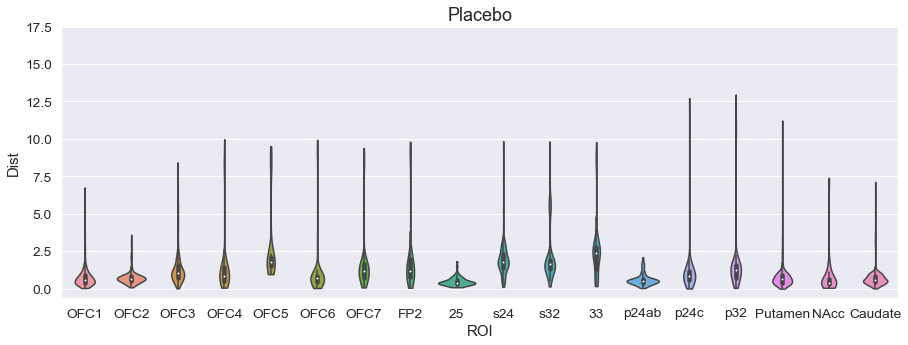

In [235]:
plt.figure(figsize=(15,5))
sns.set(font_scale = 1.25)
ax = sns.violinplot(x="ROI", y="Dist", data=p_df, order= roi_list_plot, split=True, cut=0)
plt.setp(ax,yticks=[0, 2.5, 5, 7.5, 10, 12.5, 15, 17.5])
#plt.ylim=(0, 15)
plt.title('Placebo', fontsize=18)

In [145]:
b_p_df = pd.DataFrame.from_dict(b_p_dist_dict,orient='index')

In [146]:
b_k_df = pd.DataFrame.from_dict(b_k_dist_dict,orient='index')

Text(0.5, 1.0, 'Baseline Placebo')

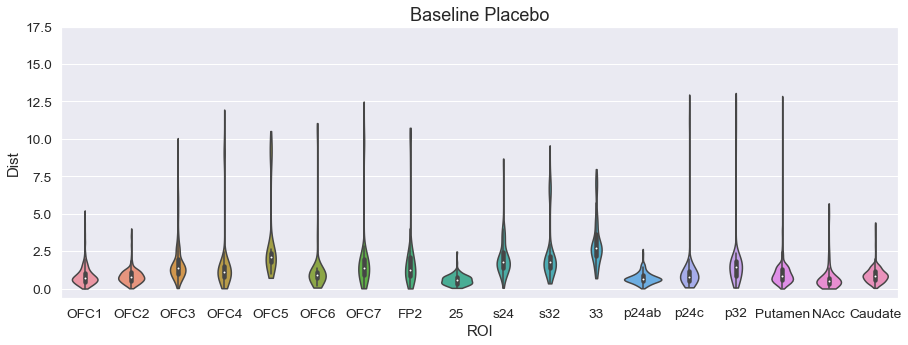

In [234]:
plt.figure(figsize=(15,5))
sns.set(font_scale = 1.25)
ax = sns.violinplot(x="ROI", y="Dist", data=b_p_df, order=roi_list_plot, split=True, cut=0)
plt.setp(ax,yticks=[0, 2.5, 5, 7.5, 10, 12.5, 15, 17.5])
#plt.ylim=(0, 15)
plt.title('Baseline Placebo', fontsize=18)

Text(0.5, 1.0, 'Baseline Ketamine')

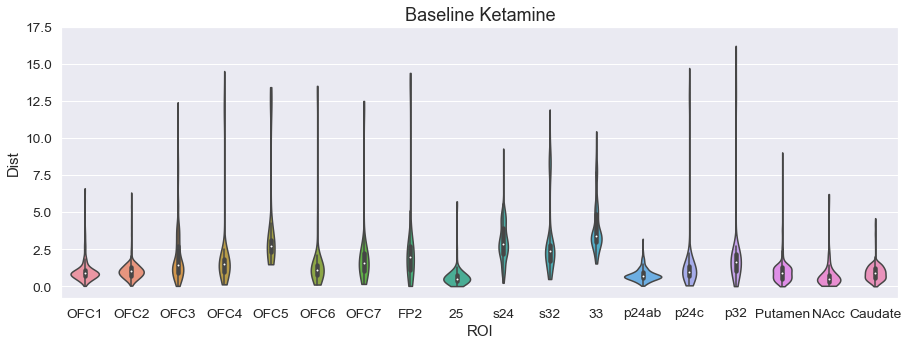

In [233]:
plt.figure(figsize=(15,5))
sns.set(font_scale = 1.25)
ax = sns.violinplot(x="ROI", y="Dist", data=b_k_df, order=roi_list_plot, split=True, cut=0)
plt.setp(ax,yticks=[0, 2.5, 5, 7.5, 10, 12.5, 15, 17.5])
#plt.ylim=(0, 15)
plt.title('Baseline Ketamine', fontsize=18)

Calculate difference between placebo and its baseline

In [151]:
for entry in p_dist_dict:
    p = p_dist_dict[entry]['Dist']
    b = b_p_dist_dict[entry]['Dist']
    diff=p-b
    p_dist_dict[entry]['Diff']=copy.deepcopy(diff)

In [152]:
p_dist_dict

{0: {'x': -2.2325849533081055,
  'y': -3.420443534851074,
  'ROI': 'OFC1',
  'ID': 205889,
  'Dist': 0.2267333249359551,
  'Diff': -1.642874487465078},
 1: {'x': -2.249701499938965,
  'y': -3.0964725017547607,
  'ROI': 'OFC1',
  'ID': 205890,
  'Dist': 0.5287460064859071,
  'Diff': -2.445304358559037},
 2: {'x': -2.4633443355560303,
  'y': -3.4756205081939697,
  'ROI': 'OFC1',
  'ID': 205980,
  'Dist': 0.18246625354369858,
  'Diff': -0.335708688585193},
 3: {'x': -2.3362796306610107,
  'y': -3.162090539932251,
  'ROI': 'OFC1',
  'ID': 206071,
  'Dist': 0.4542241677513199,
  'Diff': 0.1424752753986563},
 4: {'x': -2.292630910873413,
  'y': -4.14321756362915,
  'ROI': 'OFC1',
  'ID': 206162,
  'Dist': 0.5298270627232569,
  'Diff': 0.1233249288736773},
 5: {'x': -2.441861629486084,
  'y': -3.442966938018799,
  'ROI': 'OFC2',
  'ID': 215350,
  'Dist': 0.6333723367069144,
  'Diff': 0.05609325858815595},
 6: {'x': -2.3190386295318604,
  'y': -3.5150105953216553,
  'ROI': 'OFC2',
  'ID': 2153

In [153]:
_df = pd.DataFrame.from_dict(p_dist_dict,orient='index')

In [226]:
_df

,x,y,ROI,ID,Dist,Diff
0,-2.232585,-3.420444,OFC1,205889,0.226733,-1.642874
1,-2.249701,-3.096473,OFC1,205890,0.528746,-2.445304
2,-2.463344,-3.475621,OFC1,205980,0.182466,-0.335709
3,-2.336280,-3.162091,OFC1,206071,0.454224,0.142475
4,-2.292631,-4.143218,OFC1,206162,0.529827,0.123325
...,...,...,...,...,...,...
11878,1.419633,3.562074,Caudate,491091,1.095627,-0.579175
11879,1.423617,3.548202,Caudate,491182,1.090209,-0.509140
11880,1.422678,3.534248,Caudate,491273,1.089854,-0.476814
11881,1.413722,3.540672,Caudate,491364,1.099344,-0.492951


In [227]:
roi_list_plot = ['OFC1', 'OFC2', 'OFC3','OFC4','OFC5','OFC6','OFC7','FP2', '25', 's24', 's32', '33', 'p24ab', 'p24c', 'p32', 'Putamen', 'NAcc', 'Caudate']

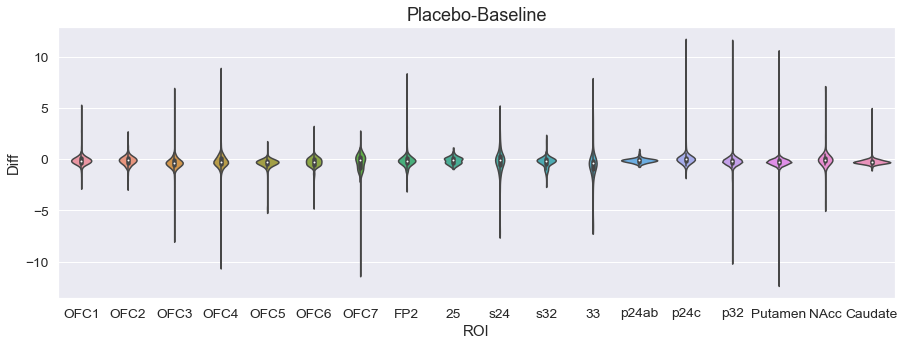

In [231]:
plt.figure(figsize=(15,5))
sns.set(font_scale = 1.25)
ax = sns.violinplot(x="ROI", y="Diff", data=_df, order= roi_list_plot, split=True, cut=0)
#plt.setp(ax,yticks=[0, 2.5, 5, 7.5, 10, 12.5, 15, 17.5])
#plt.ylim=(0, 15)
plt.title('Placebo-Baseline', fontsize=18)
plt.savefig('C:/Users/canlab/Desktop/Masterthesis_python/Dist_Placebo_Baseline_Violinplot')

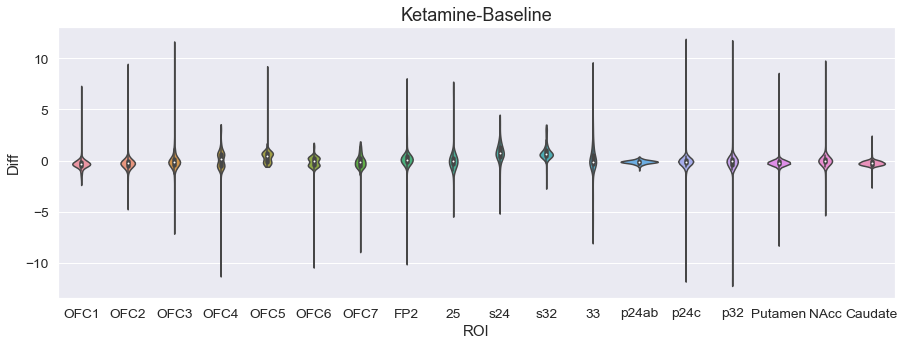

In [232]:
kb_df = pd.DataFrame.from_dict(ket_dist_dict,orient='index')
plt.figure(figsize=(15,5))
sns.set(font_scale = 1.25)
ax = sns.violinplot(x="ROI", y="Diff", order=roi_list_plot, data=kb_df, split=True, cut=0)
#plt.setp(ax,yticks=[0, 2.5, 5, 7.5, 10, 12.5, 15, 17.5])
#plt.ylim=(0, 15)
plt.title('Ketamine-Baseline', fontsize=18)
plt.savefig('C:/Users/canlab/Desktop/Masterthesis_python/Dist_Ketamine_Baseline_Violinplot')

Difference between ketamine and placebo

In [159]:
for entry in ket_dist_dict:
    k = ket_dist_dict[entry]['Diff']
    p = p_dist_dict[entry]['Diff']
    diff=k-p
    ket_dist_dict[entry]['Diff_k_p']=copy.deepcopy(diff)

In [160]:
_dict=ket_dist_dict[]

{0: {'x': 1.3133915662765503,
  'y': -0.23098969459533691,
  'ROI': 'OFC1',
  'ID': 205889,
  'Dist': 0.4208027831085193,
  'Diff': -0.8296096152336148,
  'Diff_k_p': 0.8132648722314633},
 1: {'x': 1.4064911603927612,
  'y': -0.34745585918426514,
  'ROI': 'OFC1',
  'ID': 205890,
  'Dist': 0.5377301276261912,
  'Diff': -0.5453643144216374,
  'Diff_k_p': 1.8999400441373995},
 2: {'x': 1.3203647136688232,
  'y': -0.32149776816368103,
  'ROI': 'OFC1',
  'ID': 205980,
  'Dist': 0.44781268688947384,
  'Diff': -0.6477967145524965,
  'Diff_k_p': -0.31208802596730356},
 3: {'x': 1.3174872398376465,
  'y': -0.2732459306716919,
  'ROI': 'OFC1',
  'ID': 206071,
  'Dist': 0.4320708799393741,
  'Diff': -0.44594164761715094,
  'Diff_k_p': -0.5884169230158072},
 4: {'x': 1.2966349124908447,
  'y': -0.3141494691371918,
  'ROI': 'OFC1',
  'ID': 206162,
  'Dist': 0.42297834418737706,
  'Diff': -0.3918281267352391,
  'Diff_k_p': -0.5151530556089163},
 5: {'x': 1.2379392385482788,
  'y': 0.2534130811691284

Sort the dictionaries to get s24 and s32 and sort them according to their difference between ketamine and placebo

In [161]:
ket_dist_dict.values()

dict_values([{'x': 1.3133915662765503, 'y': -0.23098969459533691, 'ROI': 'OFC1', 'ID': 205889, 'Dist': 0.4208027831085193, 'Diff': -0.8296096152336148, 'Diff_k_p': 0.8132648722314633}, {'x': 1.4064911603927612, 'y': -0.34745585918426514, 'ROI': 'OFC1', 'ID': 205890, 'Dist': 0.5377301276261912, 'Diff': -0.5453643144216374, 'Diff_k_p': 1.8999400441373995}, {'x': 1.3203647136688232, 'y': -0.32149776816368103, 'ROI': 'OFC1', 'ID': 205980, 'Dist': 0.44781268688947384, 'Diff': -0.6477967145524965, 'Diff_k_p': -0.31208802596730356}, {'x': 1.3174872398376465, 'y': -0.2732459306716919, 'ROI': 'OFC1', 'ID': 206071, 'Dist': 0.4320708799393741, 'Diff': -0.44594164761715094, 'Diff_k_p': -0.5884169230158072}, {'x': 1.2966349124908447, 'y': -0.3141494691371918, 'ROI': 'OFC1', 'ID': 206162, 'Dist': 0.42297834418737706, 'Diff': -0.3918281267352391, 'Diff_k_p': -0.5151530556089163}, {'x': 1.2379392385482788, 'y': 0.2534130811691284, 'ROI': 'OFC2', 'ID': 215350, 'Dist': 0.9810295994366471, 'Diff': -0.405

In [175]:
ket_dist_dict.items()

dict_items([(0, {'x': 1.3133915662765503, 'y': -0.23098969459533691, 'ROI': 'OFC1', 'ID': 205889, 'Dist': 0.4208027831085193, 'Diff': -0.8296096152336148, 'Diff_k_p': 0.8132648722314633}), (1, {'x': 1.4064911603927612, 'y': -0.34745585918426514, 'ROI': 'OFC1', 'ID': 205890, 'Dist': 0.5377301276261912, 'Diff': -0.5453643144216374, 'Diff_k_p': 1.8999400441373995}), (2, {'x': 1.3203647136688232, 'y': -0.32149776816368103, 'ROI': 'OFC1', 'ID': 205980, 'Dist': 0.44781268688947384, 'Diff': -0.6477967145524965, 'Diff_k_p': -0.31208802596730356}), (3, {'x': 1.3174872398376465, 'y': -0.2732459306716919, 'ROI': 'OFC1', 'ID': 206071, 'Dist': 0.4320708799393741, 'Diff': -0.44594164761715094, 'Diff_k_p': -0.5884169230158072}), (4, {'x': 1.2966349124908447, 'y': -0.3141494691371918, 'ROI': 'OFC1', 'ID': 206162, 'Dist': 0.42297834418737706, 'Diff': -0.3918281267352391, 'Diff_k_p': -0.5151530556089163}), (5, {'x': 1.2379392385482788, 'y': 0.2534130811691284, 'ROI': 'OFC2', 'ID': 215350, 'Dist': 0.9810

In [162]:
_k_df = pd.DataFrame.from_dict(ket_dist_dict,orient='index')

In [163]:
_k_df

,x,y,ROI,ID,Dist,Diff,Diff_k_p
0,1.313392,-0.230990,OFC1,205889,0.420803,-0.829610,0.813265
1,1.406491,-0.347456,OFC1,205890,0.537730,-0.545364,1.899940
2,1.320365,-0.321498,OFC1,205980,0.447813,-0.647797,-0.312088
3,1.317487,-0.273246,OFC1,206071,0.432071,-0.445942,-0.588417
4,1.296635,-0.314149,OFC1,206162,0.422978,-0.391828,-0.515153
...,...,...,...,...,...,...,...
11878,-2.929142,4.874344,Caudate,491091,1.014842,-0.609103,-0.029928
11879,-2.905139,4.878591,Caudate,491182,1.037471,-0.581608,-0.072468
11880,-2.892628,4.863963,Caudate,491273,1.040634,-0.532626,-0.055811
11881,-2.890134,4.938795,Caudate,491364,1.082671,-0.548494,-0.055544


In [182]:
split_df=_k_df.groupby('ROI')
#split_df.appy() 

In [199]:
s24=list(split_df)[16]

In [197]:
s24_df=pd.DataFrame(s24[1])
s24_df

,x,y,ROI,ID,Dist,Diff,Diff_k_p
1705,0.139166,-0.003410,s24,264582,4.476386,1.578539,2.328474
1732,0.163994,-0.145677,s24,264673,4.356738,1.911054,1.657402
2214,0.186626,0.427985,s24,274318,4.892333,0.428289,0.813700
2232,0.115994,0.257564,s24,274409,4.707860,0.140395,0.343552
2233,0.039899,0.008076,s24,274410,4.448136,1.165604,1.632754
...,...,...,...,...,...,...,...
5768,-2.981192,-7.055483,s24,334564,3.235276,0.257633,0.417393
6015,0.173046,1.101545,s24,343932,5.517631,0.541225,-3.777668
6016,0.207277,1.328128,s24,343933,5.742913,0.917755,-4.303221
6021,0.352585,0.701790,s24,344023,5.208723,-0.035354,1.479007


In [192]:
s32=list(split_df)[17]

In [200]:
s32_df=pd.DataFrame(s32[1])
s32_df

,x,y,ROI,ID,Dist,Diff,Diff_k_p
1311,0.532199,-0.353073,s32,254938,4.292660,1.518254,2.023336
1391,0.669311,-0.523227,s32,255207,4.212264,1.878664,2.170253
1760,0.333773,-0.264568,s32,264766,4.282424,2.295399,2.326039
1761,0.216680,-0.149448,s32,264767,4.339265,1.440995,1.352419
1785,0.279571,-0.360477,s32,264853,4.172560,2.504539,2.368938
...,...,...,...,...,...,...,...
5448,-2.581799,-6.973133,s32,325003,3.037395,0.299528,1.294804
5452,-2.991241,-7.107689,s32,325008,3.326317,0.374090,1.027784
5453,-3.023235,-7.137336,s32,325009,3.367219,0.493989,0.586229
5474,-2.681957,-7.089330,s32,325099,3.182151,0.708202,1.181452


Get the 5 voxels that show largest change in Difference between ketamine and placebo

In [221]:
sorted_s24_df=s24_df.sort_values(by=['Diff_k_p'],ascending=False)

In [222]:
sorted_s24_df

,x,y,ROI,ID,Dist,Diff,Diff_k_p
4877,-3.058445,-7.782920,s24,314453,3.937080,0.594926,8.236997
5373,-3.137073,-7.780452,s24,324372,3.963489,0.617523,7.804681
5379,-3.092263,-7.514478,s24,324463,3.700498,0.533469,7.471633
4870,-2.927916,-7.864942,s24,314363,3.970085,0.022655,6.976734
4257,0.408622,0.971157,s24,304349,5.479118,4.179372,5.778891
...,...,...,...,...,...,...,...
6015,0.173046,1.101545,s24,343932,5.517631,0.541225,-3.777668
5748,-2.843744,-8.010559,s24,334200,4.083002,-5.198588,-4.034807
4240,-2.749039,-6.656291,s24,304171,2.776426,-2.002414,-4.059994
4250,-2.509734,-6.614583,s24,304263,2.651662,-1.594371,-4.070292


In [225]:
largest_s24=sorted_s24_df[0:5][:]
largest_s24.to_pickle('C:/Users/canlab/Desktop/Masterthesis_python/largest_5_voxels_s24')
largest_s24

,x,y,ROI,ID,Dist,Diff,Diff_k_p
4877,-3.058445,-7.782920,s24,314453,3.937080,0.594926,8.236997
5373,-3.137073,-7.780452,s24,324372,3.963489,0.617523,7.804681
5379,-3.092263,-7.514478,s24,324463,3.700498,0.533469,7.471633
4870,-2.927916,-7.864942,s24,314363,3.970085,0.022655,6.976734
4257,0.408622,0.971157,s24,304349,5.479118,4.179372,5.778891


In [215]:
sorted_s32_df=s32_df.sort_values(by=['Diff_k_p'],ascending=False)
sorted_s32_df

,x,y,ROI,ID,Dist,Diff,Diff_k_p
2331,0.019293,-0.359633,s32,274771,4.069439,3.511681,4.133112
2335,-0.003465,-0.409194,s32,274776,4.014970,3.086293,4.009193
2304,0.052073,-0.277591,s32,274680,4.157788,3.392876,3.744995
2332,0.012188,-0.348078,s32,274772,4.077534,3.395457,3.698203
2359,-0.050799,-0.427927,s32,274862,3.980160,3.395256,3.628615
...,...,...,...,...,...,...,...
3227,1.415540,4.961887,s32,285419,9.552864,0.791305,-1.181553
4960,0.152342,5.392189,s32,314999,9.670250,1.087015,-1.281084
2448,0.028254,2.760368,s32,275135,7.063314,-1.332342,-1.632982
2943,-1.809118,-6.099903,s32,284599,1.988167,-2.714453,-1.684373


In [224]:
largest_s32=sorted_s32_df[0:5][:]
largest_s32.to_pickle('C:/Users/canlab/Desktop/Masterthesis_python/largest_5_voxels_s32')
largest_s32

,x,y,ROI,ID,Dist,Diff,Diff_k_p
2331,0.019293,-0.359633,s32,274771,4.069439,3.511681,4.133112
2335,-0.003465,-0.409194,s32,274776,4.014970,3.086293,4.009193
2304,0.052073,-0.277591,s32,274680,4.157788,3.392876,3.744995
2332,0.012188,-0.348078,s32,274772,4.077534,3.395457,3.698203
2359,-0.050799,-0.427927,s32,274862,3.980160,3.395256,3.628615
